In [2]:
# General purpose imports to handle paths, files etc
import os
import os.path as op
import glob
import pandas as pd
import numpy as np
import json
import requests
import urllib.request
from tqdm import tqdm
# FSL function wrappers which we will call from python directly
from fsl.wrappers import fast, bet
from fsl.wrappers.misc import fslroi
from fsl.wrappers import flirt

import nibabel as nib

from tqdm.notebook import trange, tqdm
import matplotlib.pyplot as plt
from nilearn.image import iter_img
from nilearn.plotting import plot_stat_map, show
from sklearn.decomposition import FastICA, PCA

from nilearn import datasets
from nilearn.input_data import NiftiMasker
from scipy.stats import zscore
from scipy.io import loadmat
from IPython.display import Image
from scipy.io import loadmat

def reset_overlays():
    """
    Clears view and completely remove visualization. All files opened in FSLeyes are closed.
    The view (along with any color map) is reset to the regular ortho panel.
    """
    l = frame.overlayList
    while(len(l)>0):
        del l[0]
    frame.removeViewPanel(frame.viewPanels[0])
    # Put back an ortho panel in our viz for future displays
    frame.addViewPanel(OrthoPanel)
    
def mkdir_no_exist(path):
    if not op.isdir(path):
        os.makedirs(path)

from nilearn import image
from nilearn.plotting import plot_prob_atlas
%matplotlib inline
from nilearn.image import iter_img
from nilearn.plotting import plot_stat_map, show
from nilearn.decomposition import CanICA

#Make function for everything 

def spatial_ICA(func_path, anat_path, ica_comp, pca = True, pca_comp = None,  axial_plots = True, other_plots = False, filename = "plot"): 

    img = nib.load(func_path)
    affine = img.affine
    fdata = img.get_fdata()
    x, y, z, N_vol = fdata.shape
    display("Got fdata of dimensions =", x, y, z, N_vol)
    
    X_ = fdata.reshape(-1, fdata.shape[-1])
    X = X_.T
    display("X shape =", X.shape)
    
    T1w_img = nib.load(anat_path)
    skull = nib.load("skull.nii.gz")
    masker = NiftiMasker(mask_img=skull)
    #plot_stat_map(icbms.mask, black_bg=True, title='the brain mask', colorbar=False,)
    
    S_dict = {}

    nb_components =  [ica_comp,]#10]#20, 60 ...]
    
    
    for n in nb_components:

        if (pca):
            print(f"Processing component {n}")
            # run PCA as a preprocessing step for ICA with twice the number of components
            n2=2*n

            if (pca_comp is not None):
                n2 = pca_comp
            pca = PCA(n_components=n2)
            H = pca.fit_transform(X.T)  # Reconstruct signals based on orthogonal components
            display(pca.explained_variance_ratio_, "Explained Variance = ", np.sum(pca.explained_variance_ratio_))
        else:
            H = X.T
        
        display("Running FastICA with n = %d components" %n)

        ica = FastICA(n_components=n, random_state=1, max_iter=200)
        display("size H", H.shape)
        S_ = ica.fit_transform(H)  # Get the estimated sources (S)
        display("size S", S_.shape)
        print(S_.shape)
        W_ = ica.components_ # Get the estimated un-mixing matrix (W) -- will not be used further on
        S_dict[n] = S_ # store the results in a dictionary
    
    display("Done ICA")

    if (axial_plots):
        for n in nb_components:
            print('Number of components: ', n)
            S_ = S_dict[n].copy()
            for idx, s in enumerate(S_.T[:min(10, S_.T.shape[0]),:]): # plot min(4, #comp_estimated) components , change 10 with 4 to plot less
                s_img = nib.Nifti1Image(np.reshape(s, (x,y,z)), affine)
                data = masker.fit_transform(s_img)
                masked_ = masker.inverse_transform(data) #mask the components
                plot_stat_map(masked_, display_mode="z", title='Case of {} estimated components: comp #{}'.format(n,idx+1),
                              colorbar=True, black_bg=True, threshold=2*np.std(s), bg_img=T1w_img)
                              #output_file=filename + "ICA_components_{}_n_{}.png".format(idx,n)) # uncomment to save plot
                plt.show()

    if (other_plots):
        #* Plot the group-level independent components for the different number of requested components.
        for n in nb_components:
            print('Number of components: ', n)
            S_ = S_dict[n].copy()
            for idx, s in enumerate(S_.T[:min(10, S_.T.shape[0]),:]): # plot min(4, #comp_estimated) components
                s_img = nib.Nifti1Image(np.reshape(s, (x,y,z)), affine)
                data = masker.fit_transform(s_img)
                masked_ = masker.inverse_transform(data) # mask the components
                plot_stat_map(masked_, display_mode="ortho", title='Case of {} estimated components: comp #{}'.format(n,idx+1),
                              colorbar=True, black_bg=True, threshold=2*np.std(s), bg_img=T1w_img,)
                              #output_file=save_results + "ICA_components_{}_n_{}.png".format(idx,n)) # uncomment to save plot
                plt.show()
    display("Done all")
    return S_dict

class groupICA:
    def fit_data(self, func_expl, func_folder_path, anat_path, skull, N_subj = 10):
        
        
        img = nib.load(func_expl)
        affine = img.affine
        fdata = img.get_fdata()
        x, y, z, N_vol = fdata.shape
        N_tot=N_vol*N_subj
        
        display("dims =", x,y,z, N_vol)

        X = np.zeros((N_tot,x*y*z))
        nii_count = 0
        for root, dirs, files in sorted(os.walk(func_folder_path)):
            if (files and 'bold' in files[0]):
                if (nii_count < N_subj):
                    display("nii_count:", nii_count)
                    func_fdata = nib.load(root + '/' + files[0]).get_fdata()
                    
                    subject_X = func_fdata.reshape(-1, fdata.shape[-1]).T
                    #subject_X = zscore(subject_X, axis = None)
                    
                    X[nii_count * N_vol:(nii_count + 1) * N_vol, :] = subject_X
                    nii_count += 1
        
        self.X = np.nan_to_num(X,0)
        self.anat_path = anat_path
        self.dims = x, y, z, N_vol, N_tot
        self.affine = affine
        self.skull = skull
        
        display("X shape =", X.shape)
        return 0

    def execute(self, ica_comp, pca = True, pca_comp = None, axial_plots = True, other_plots = False, type = "spatial"):
        
    
        T1w_img = nib.load(self.anat_path)
        x, y, z, N_vol, _ = self.dims

        masker = NiftiMasker(mask_img=self.skull)
        plot_stat_map(self.skull, black_bg=True, title='the brain mask', colorbar=False,)
    
        S_dict = {}

        nb_components =  [ica_comp,]#10]#20, 60 ...]
        
        if (type == "temporal"):
            self.X = self.X.T
            
        for n in nb_components:

            if (pca):
                print(f"Processing component {n}")
                # run PCA as a preprocessing step for ICA with twice the number of components
                n2=2*n

                if (pca_comp is not None):
                    n2 = pca_comp
                    
                pca = PCA(n_components=n2)
                H = pca.fit_transform(self.X.T)  # Reconstruct signals based on orthogonal components
                display(pca.explained_variance_ratio_, "Explained Variance = ", np.sum(pca.explained_variance_ratio_))
            else:
                H = self.X.T
        
            display("Running FastICA with n = %d components" %n)
            ica = FastICA(n_components=n, random_state=1, max_iter=200)
            display("size H", H.shape)
            S_ = ica.fit_transform(H)  # Get the estimated sources (S)
            display("size S", S_.shape)
            print(S_.shape)
            #W_ = ica.components_ # Get the estimated un-mixing matrix (W) -- will not be used further on
            S_dict[n] = S_ # store the results in a dictionary
    
        display("Done ICA")
    
        if (axial_plots):
            for n in nb_components:
                print('Number of components: ', n)
                S_ = S_dict[n].copy()
                for idx, s in enumerate(S_.T[:min(20, S_.T.shape[0]),:]): # plot min(4, #comp_estimated) components , change 10 with 4 to plot less
                    s_img = nib.Nifti1Image(np.reshape(s, (x,y,z)), self.affine)
                    data = masker.fit_transform(s_img)
                    masked_ = masker.inverse_transform(data) #mask the components
                    plot_stat_map(masked_, display_mode="z", title='Case of {} estimated components: comp #{}'.format(n,idx+1),
                                  colorbar=True, black_bg=True, threshold=2*np.std(s), bg_img=T1w_img)
                                  #output_file=save_results + "ICA_components_{}_n_{}.png".format(idx,n)) # uncomment to save plot
                    plt.show()
    
        if (other_plots):
            #* Plot the group-level independent components for the different number of requested components.
            for n in nb_components:
                print('Number of components: ', n)
                S_ = S_dict[n].copy()
                for idx, s in enumerate(S_.T[:min(10, S_.T.shape[0]),:]): # plot min(4, #comp_estimated) components
                    s_img = nib.Nifti1Image(np.reshape(s, (x,y,z)), self.affine)
                    data = masker.fit_transform(s_img)
                    masked_ = masker.inverse_transform(data) # mask the components
                    plot_stat_map(masked_, display_mode="ortho", title='Case of {} estimated components: comp #{}'.format(n,idx+1),
                                  colorbar=True, black_bg=True, threshold=2*np.std(s), bg_img=T1w_img)
                                  #output_file=save_results + "ICA_components_{}_n_{}.png".format(idx,n)) # uncomment to save plot
                    plt.show()
        display("Done all")
        return S_dict

# MINI PROJECT 2, Variant 3

In [3]:
bids_root = op.join(os.path.abspath(""))
print(bids_root)

func_name = f"sub-04_task-watchmovie_bold.nii.gz"
anat_name = "sub-04_T1w.nii.gz"

img = nib.load(func_name)
affine = img.affine
fdata = img.get_fdata()
x, y, z, N_vol = fdata.shape

## Independent Component Analysis (ICA)

'Got fdata of dimensions ='

61

73

61

1028

'X shape ='

(1028, 271633)

array([9.99968829e-01, 3.39776795e-06, 1.76236724e-06, 1.56847129e-06,
       1.40762376e-06, 1.06679638e-06, 9.97099209e-07, 8.92371295e-07])

'Explained Variance = '

0.9999799218607478

'Running FastICA with n = 4 components'

'size H'

(271633, 8)

'size S'

(271633, 4)

'Done ICA'

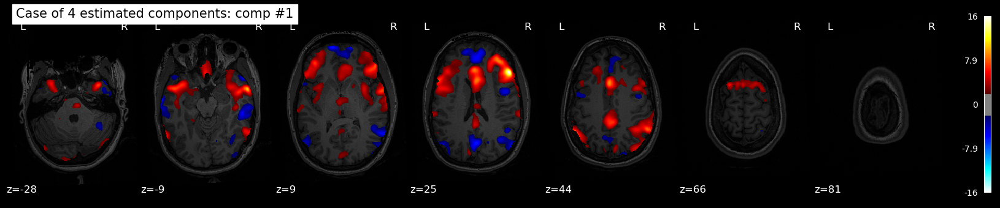

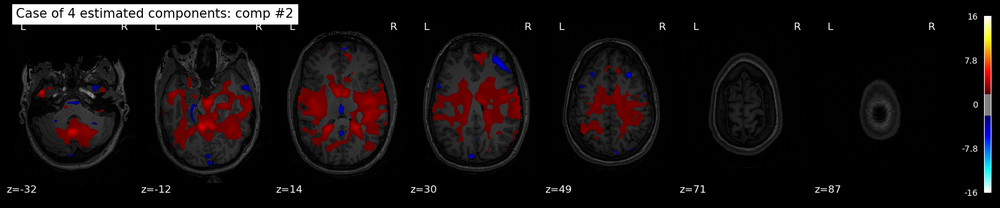

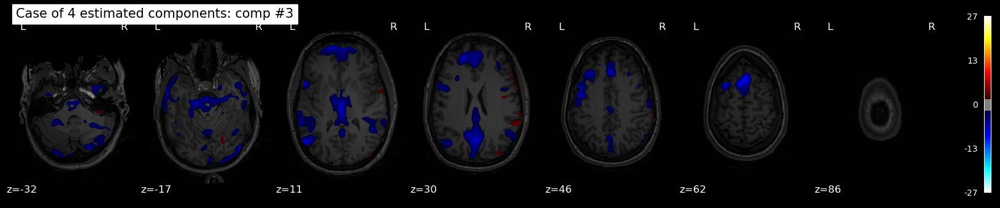

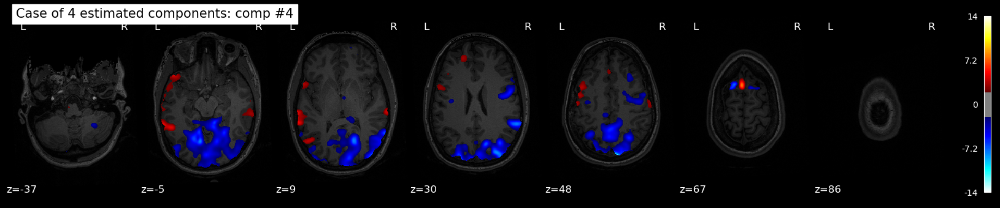

'Done all'

{4: array([[-0.21157581, -0.32531583,  0.35058664,  0.26328716],
        [-0.21157566, -0.32531623,  0.35058632,  0.26328707],
        [-0.21157566, -0.32531623,  0.35058632,  0.26328707],
        ...,
        [-0.21157566, -0.32531623,  0.35058632,  0.26328707],
        [-0.21157566, -0.32531623,  0.35058632,  0.26328707],
        [-0.21157566, -0.32531623,  0.35058632,  0.26328707]])}

In [ ]:
spatial_ICA(func_path = func_name, anat_path = anat_name, ica_comp = 4, pca = True, filename = "first_4")

## Varying the number of components

In [1]:
#spatial_ICA(func_path = func_name, anat_path = anat_name, ica_comp = 8, filename = "first_8")

'Got fdata of dimensions ='

61

73

61

1028

'X shape ='

(1028, 271633)

array([9.99968829e-01, 3.39776795e-06, 1.76236724e-06, 1.56847129e-06,
       1.40762376e-06, 1.06679639e-06, 9.97099267e-07, 8.92373021e-07,
       8.03246963e-07, 6.85793863e-07, 6.71793718e-07, 6.10027516e-07,
       5.41233462e-07, 5.41123392e-07, 4.76076848e-07, 4.51988314e-07,
       4.09494259e-07, 3.72931446e-07, 3.44926368e-07, 3.24817912e-07,
       2.83885191e-07, 2.66627824e-07, 2.55540864e-07, 2.41049606e-07,
       2.23643188e-07, 2.13110995e-07, 2.05213816e-07, 1.93650357e-07,
       1.86949369e-07, 1.80854216e-07, 1.76958004e-07, 1.71715849e-07,
       1.62068900e-07, 1.55702576e-07, 1.47935259e-07, 1.36825005e-07,
       1.28442830e-07, 1.23314835e-07, 1.19434091e-07, 1.17389515e-07])

'Explained Variance = '

0.9999898456288967

'Running FastICA with n = 20 components'

'size H'

(271633, 40)

'size S'

(271633, 20)

'Done ICA'

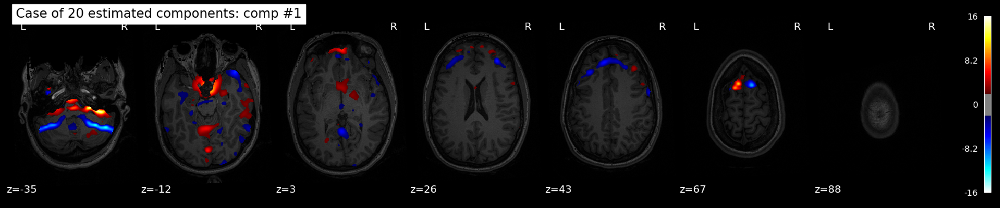

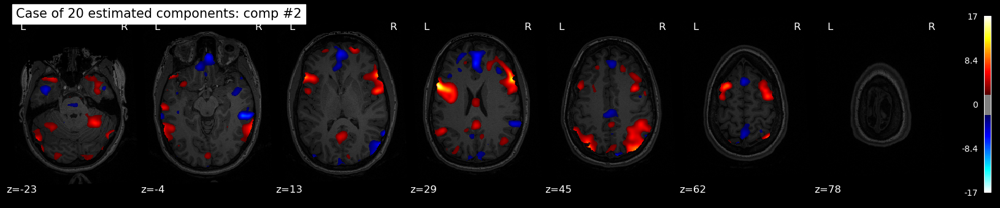

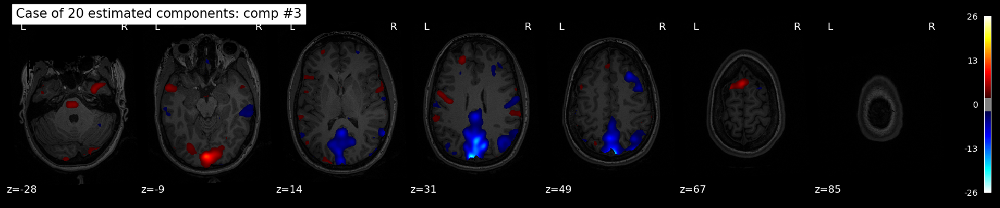

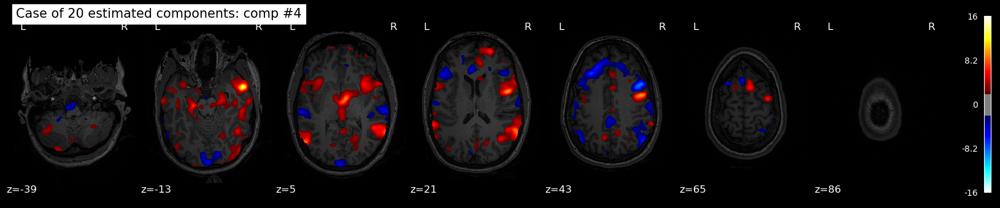

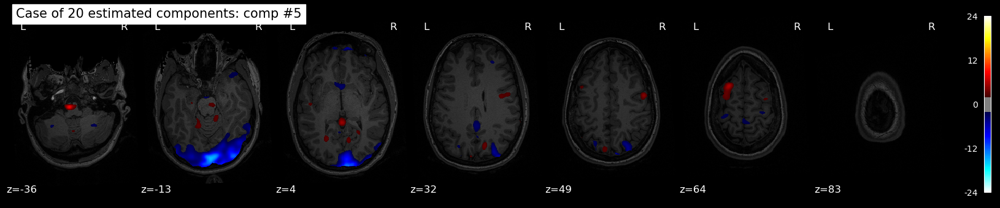

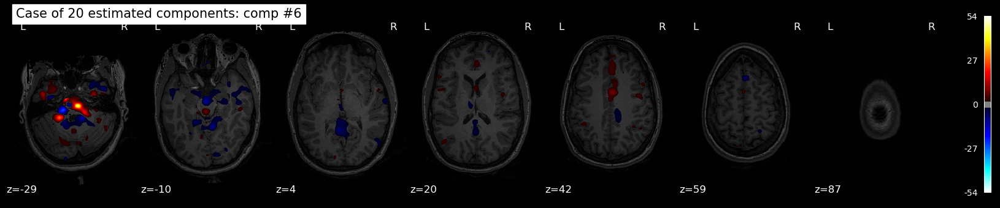

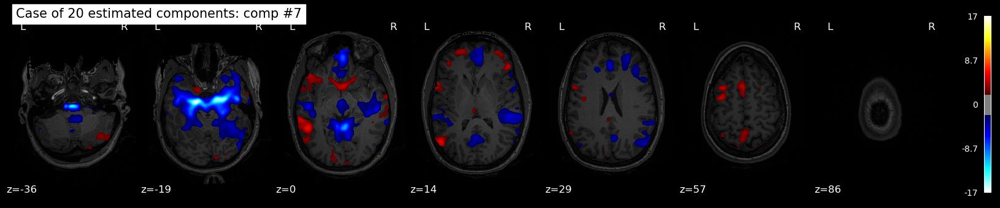

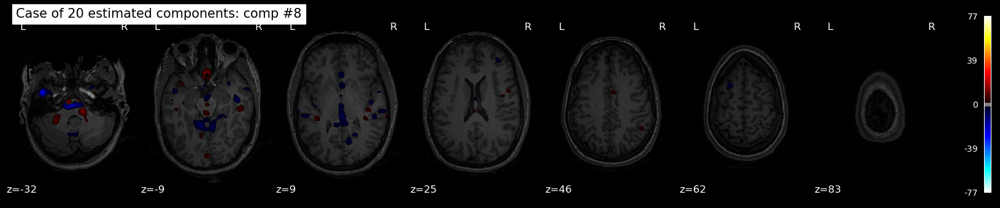

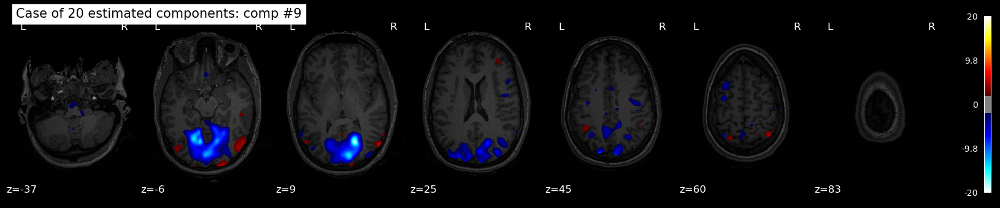

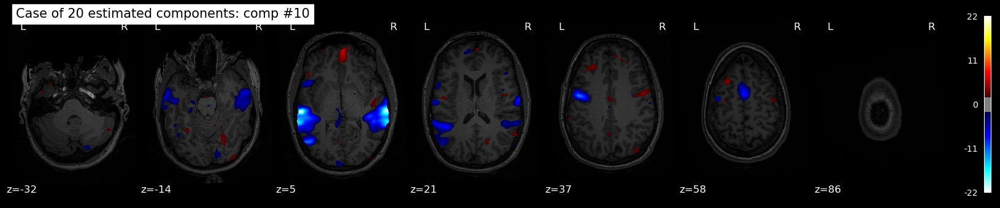

'Done all'

{20: array([[-0.10066541, -0.14188748,  0.11844574, ...,  0.04752731,
          0.20552974,  0.02816183],
        [-0.10066548, -0.14188744,  0.11844564, ...,  0.04752723,
          0.20553025,  0.02816164],
        [-0.10066548, -0.14188744,  0.11844564, ...,  0.04752723,
          0.20553025,  0.02816164],
        ...,
        [-0.10066548, -0.14188744,  0.11844564, ...,  0.04752723,
          0.20553025,  0.02816164],
        [-0.10066548, -0.14188744,  0.11844564, ...,  0.04752723,
          0.20553025,  0.02816164],
        [-0.10066548, -0.14188744,  0.11844564, ...,  0.04752723,
          0.20553025,  0.02816164]])}

In [ ]:
spatial_ICA(func_path = func_name, anat_path = anat_name, ica_comp = 20, pca = True, filename = "first_20")

# Temporal ICA

In [ ]:
#Run a temporal ICA
img = nib.load(func_name)
fdata = img.get_fdata()

nb_components =  [3,]#10]#20, 60 ...]
X_ = fdata.reshape(-1, fdata.shape[-1])

T_dict = {}

for n in nb_components:
    
    H = X_.T
    
    display("Running FastICA with n = %d components" %n)

    ica = FastICA(n_components=n, random_state=1, max_iter=200)
    display("size H", H.shape)
    T_ = ica.fit_transform(H)  # Get the estimated sources (S)
    display("size T", T_.shape)
    W_ = ica.components_ # Get the estimated un-mixing matrix (W) -- will not be used further on
    T_dict[n] = T_ # store the results in a dictionary

    display("Done Temporal ICA")

'Running FastICA with n = 3 components'

'size H'

(1028, 271633)

'size T'

(1028, 3)

'Done Temporal ICA'

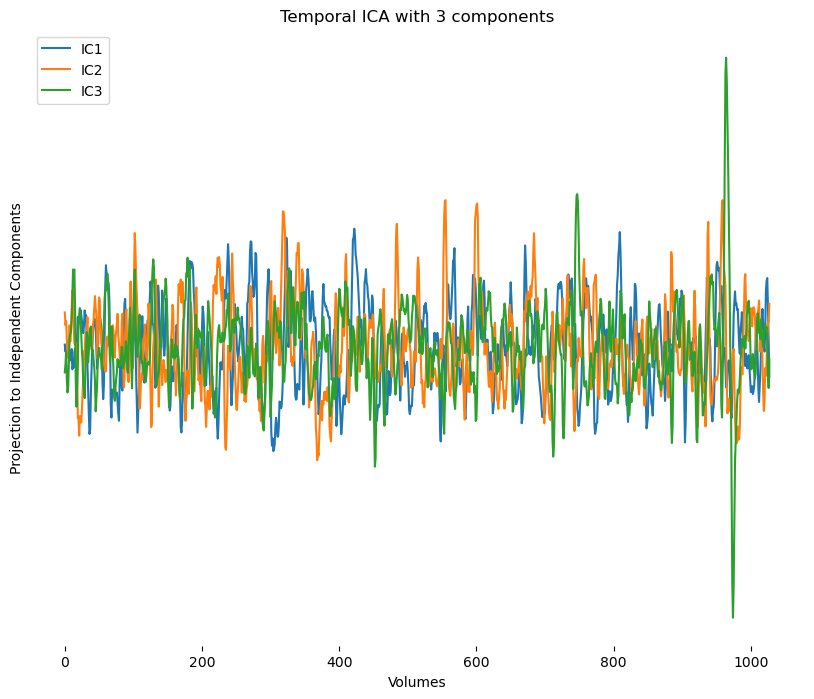

In [ ]:
#Raw plot
temporal_ica = pd.DataFrame(T_dict[3])
#temporal_ica = temporal_ica.applymap(lambda x: round(x, 1)) #binning values
#temporal_ica = temporal_ica.applymap(lambda x: 0.5*x if np.abs(x) < 1 else x)
#dc_component = [7, 0, -7]
#temporal_ica = temporal_ica.apply(lambda x: x + dc_component[x.name], axis = 0)
#display(temporal_ica)
plt.figure(figsize = (10, 8))
plt.title("Temporal ICA with 3 components")
plt.plot(temporal_ica, label = [f"IC{i}" for i in range(1,4)])
plt.legend()
plt.ylabel('Projection to Independent Components')
plt.xlabel('Volumes')
plt.yticks([])
plt.box(False)
plt.show()

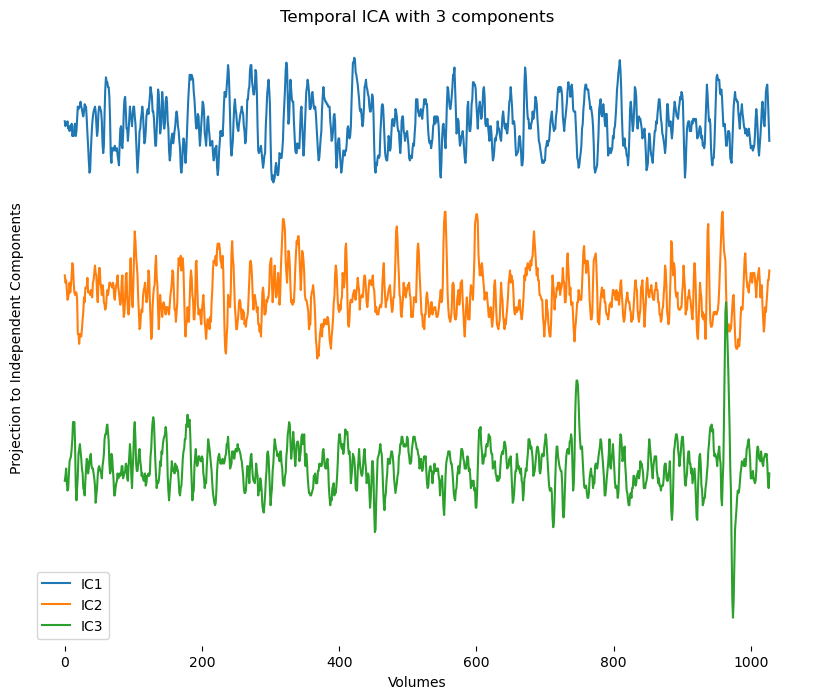

In [ ]:
#separation
temporal_ica = pd.DataFrame(T_dict[3])
temporal_ica = temporal_ica.applymap(lambda x: round(x, 1)) #binning values
#temporal_ica = temporal_ica.applymap(lambda x: 0.5*x if np.abs(x) < 1 else x)
dc_component = [7, 0, -7]
temporal_ica = temporal_ica.apply(lambda x: x + dc_component[x.name], axis = 0)
#display(temporal_ica)
plt.figure(figsize = (10, 8))
plt.title("Temporal ICA with 3 components")
plt.plot(temporal_ica, label = [f"IC{i}" for i in range(1,4)])
plt.legend()
plt.ylabel('Projection to Independent Components')
plt.xlabel('Volumes')
plt.yticks([])
plt.box(False)
plt.show()

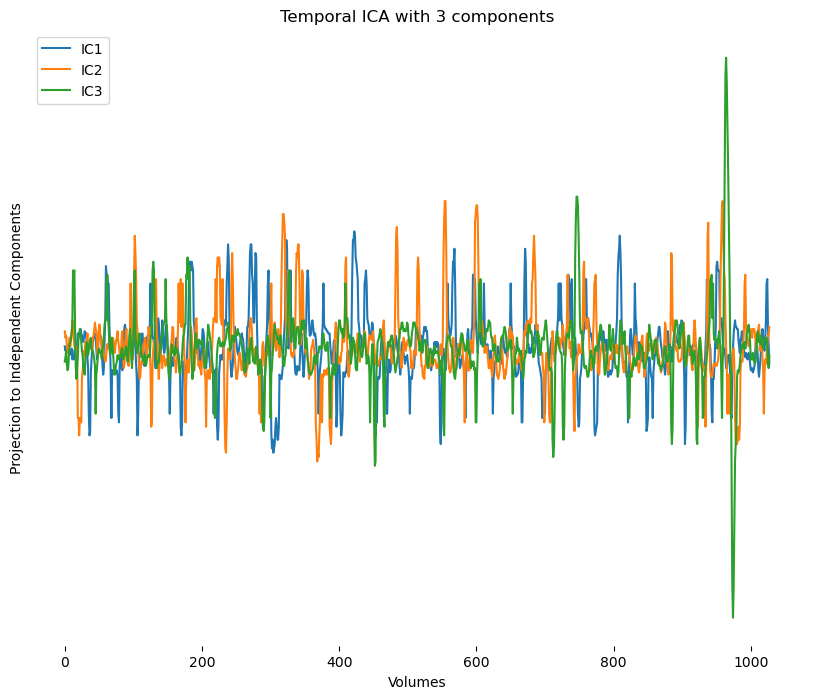

In [ ]:
#noise reduction
temporal_ica = pd.DataFrame(T_dict[3])
temporal_ica = temporal_ica.applymap(lambda x: round(x, 1)) #binning values
temporal_ica = temporal_ica.applymap(lambda x: 0.5*x if np.abs(x) < 1.5 else x)
#dc_component = [7, 0, -7]
#temporal_ica = temporal_ica.apply(lambda x: x + dc_component[x.name], axis = 0)
#display(temporal_ica)
plt.figure(figsize = (10, 8))
plt.title("Temporal ICA with 3 components")
plt.plot(temporal_ica, label = [f"IC{i}" for i in range(1,4)])
plt.legend()
plt.ylabel('Projection to Independent Components')
plt.xlabel('Volumes')
plt.yticks([])
plt.box(False)
plt.show()

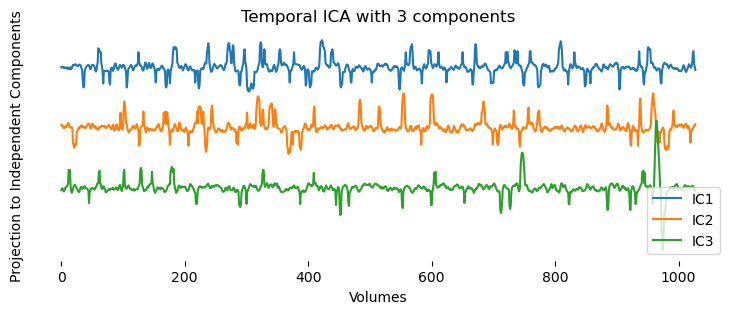

In [ ]:
#noise reduction
temporal_ica = pd.DataFrame(T_dict[3])
temporal_ica = temporal_ica.applymap(lambda x: round(x, 1)) #binning values
temporal_ica = temporal_ica.applymap(lambda x: 0.35*x if np.abs(x) < 1.5 else x)
dc_component = [6, 0, -6]
temporal_ica = temporal_ica.apply(lambda x: x + dc_component[x.name], axis = 0)
#display(temporal_ica)
plt.figure(figsize = (9, 3))
plt.title("Temporal ICA with 3 components")
plt.plot(temporal_ica, label = [f"IC{i}" for i in range(1,4)])
plt.legend()
plt.ylabel('Projection to Independent Components')
plt.xlabel('Volumes')
plt.yticks([])
plt.box(False)
plt.savefig(f"TemporalICA.png", bbox_inches='tight', dpi = 200)
plt.show()

## Group ICA
### Extremely computationally costly, consistenly crashed the VM and personal pc's

In [ ]:
func_name = f"sub-04_task-watchmovie_bold.nii.gz"
anat_name = "sub-04_T1w.nii.gz"
dataset_id = 'ds001145' 
subj = '04'

# Download one subject's data from each dataset
sample_path = "dataset"
mkdir_no_exist(sample_path)
bids_root = op.join(os.path.abspath(""),sample_path, dataset_id)
deriv_root = op.join(bids_root, 'derivatives')
preproc_root = op.join(bids_root, 'derivatives','preprocessed_data')

mkdir_no_exist(bids_root)

#subject_list = [f"0{i}" for i in range(1, 10)] + ["10"]
#subject_list

In [ ]:
#Careful only run once
#for subj in subject_list:
#    os.system("""openneuro-py download --dataset {} --include sub-{}/anat/sub-{}_T1w.nii.gz
#              --include sub-{}/func/sub-{}_task-watchmovie_bold.nii.gz 
#              --include dataset_description.json 
#              --target_dir {}""".format(dataset_id, subj, subj, subj, subj, bids_root).replace("\n", " "))

In [ ]:
gICA = groupICA()
gICA.fit_data(func_name, bids_root, anat_name, skull = "skull.nii.gz", N_subj = 3)

'dims ='

61

73

61

1028

'nii_count:'

0

'nii_count:'

1

'nii_count:'

2

'X shape ='

(3084, 271633)

0

array([9.68103783e-01, 2.08842181e-02, 1.09730952e-02, 2.66657644e-06,
       2.12662331e-06, 1.55886727e-06, 1.48872499e-06, 1.40647746e-06])

'Explained Variance = '

0.9999703430761199

'Running FastICA with n = 4 components'

'size H'

(271633, 8)

'size S'

(271633, 4)

'Done ICA'

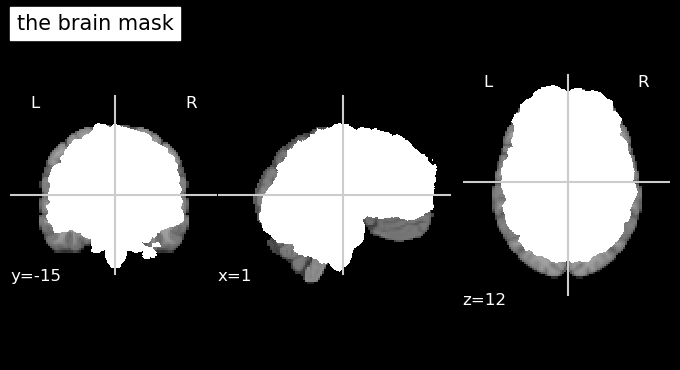

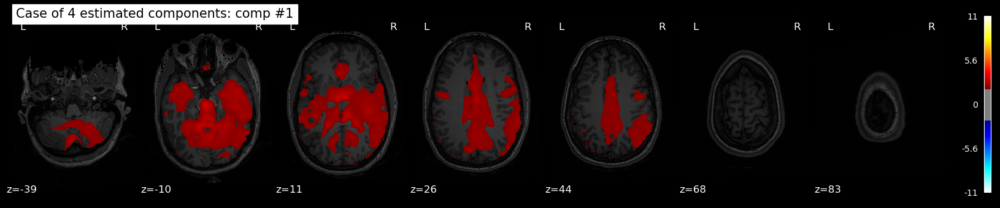

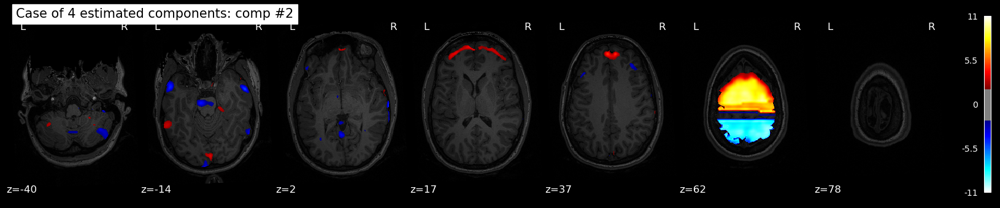

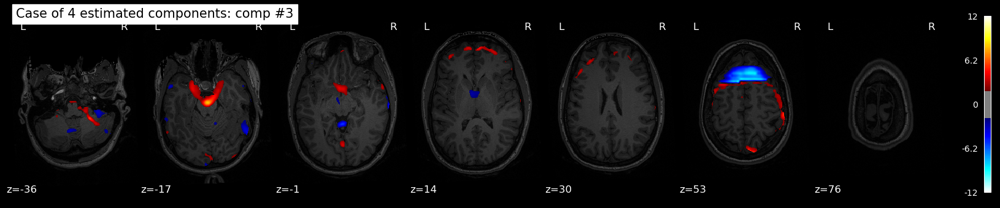

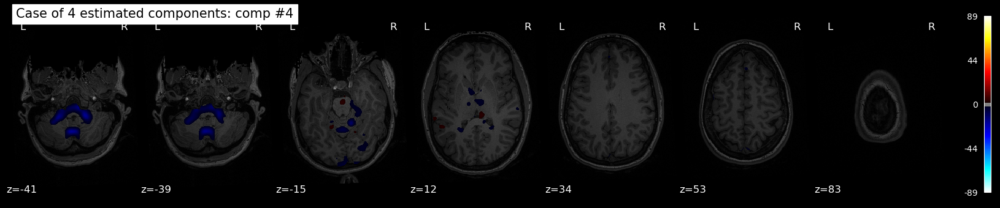

'Done all'

{4: array([[-0.57200239, -0.03508471, -0.11810464,  0.11306275],
        [-0.57200238, -0.03508471, -0.11810463,  0.11306282],
        [-0.57200238, -0.03508471, -0.11810463,  0.1130628 ],
        ...,
        [-0.57200238, -0.03508471, -0.11810463,  0.11306281],
        [-0.57200238, -0.03508471, -0.11810463,  0.11306281],
        [-0.57200238, -0.03508471, -0.11810463,  0.11306281]])}

In [ ]:
gICA.execute(ica_comp = 4, pca = True, pca_comp = None, axial_plots = True, other_plots = False, type = "spatial")

# AAL Atlas Mapping of Independent Components

In [ ]:
oxford_atlas = datasets.fetch_atlas_harvard_oxford(atlas_name = 'cort-maxprob-thr50-2mm')
ox_data = oxford_atlas['maps'].get_fdata()

In [ ]:
display(ox_data.shape,
np.unique(ox_data), oxford_atlas.keys())

(91, 109, 91)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48.])

dict_keys(['filename', 'maps', 'labels'])

In [ ]:
from nilearn import datasets, plotting
from nilearn.plotting import plot_roi

aal_atlas = datasets.fetch_atlas_aal()

maps = aal_atlas.maps
labels = aal_atlas.labels
indices = aal_atlas.indices
# Plot the AAL atlas on a black background
#plot_roi(maps, title="AAL Atlas", black_bg=False, display_mode = 'ortho')

'Got fdata of dimensions ='

61

73

61

1028

'X shape ='

(1028, 271633)

array([9.99968829e-01, 3.39776795e-06, 1.76236724e-06, 1.56847129e-06,
       1.40762376e-06, 1.06679636e-06, 9.97099228e-07, 8.92372992e-07])

'Explained Variance = '

0.99997992186244

'Running FastICA with n = 4 components'

'size H'

(271633, 8)

'size S'

(271633, 4)

'Done ICA'

'Done all'

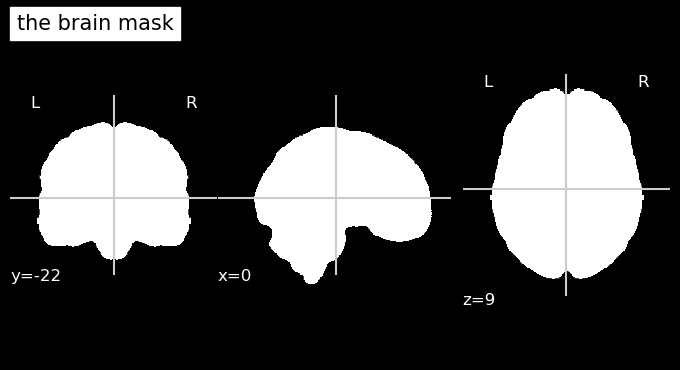

In [ ]:
S_dict = spatial_ICA(func_name, anat_name, ica_comp = 4, pca = True, pca_comp = None,  axial_plots = False, other_plots = False)

In [ ]:
s = S_dict[4]
s_t = np.where(np.abs(s) > 3, 1., 0.) 
maps_niimg = nib.load(aal_atlas.maps).get_fdata()
maps_affine = nib.load(aal_atlas.maps).affine
results = pd.DataFrame()
fails = []

In [ ]:
for n_component in range(s_t.shape[1]):
    
    failed_indices = []
    s_img = nib.Nifti1Image(np.reshape(s_t[:,n_component], (x,y,z)), affine)
    total_component_voxels = np.sum(s_t[:, n_component])
    #s_img = resample_to_img(s_img, atlas_niimg)
    display("ica component:", n_component + 1)
    
    for j, brain_part_idx in enumerate(indices): 
        
        brain_part_map = nib.Nifti1Image(np.where(maps_niimg == float(brain_part_idx), 1., 0.), maps_affine)
        brain_part_map = resample_to_img(brain_part_map, s_img)
        atlas_masker = NiftiMasker(mask_img=brain_part_map)
        if (j%50 == 0): display("j status", j)
        try:
            data = atlas_masker.fit_transform(s_img)
            masked_ = atlas_masker.inverse_transform(data) #mask the components
            fdata = masked_.get_fdata().flatten()
            results.loc[n_component, labels[j]] = round(100*np.sum(fdata)/total_component_voxels, 1)
        except:
            failed_indices.append(j)
            continue
    fails.append(failed_indices)

'ica component:'

1

'j status'

0

'j status'

50

'j status'

100

'ica component:'

2

'j status'

0

'j status'

50

'j status'

100

'ica component:'

3

'j status'

0

'j status'

50

'j status'

100

'ica component:'

4

'j status'

0

'j status'

50

'j status'

100

In [ ]:
for n_component in range(s_t.shape[1]):
    display(f"ICA component number {n_component+1} sorted brain parts in %")
    display(results.sort_values(by = n_component, axis = 1, ascending = False).T[[n_component]].T)

'ICA component number 1 sorted brain parts in %'

,Temporal_Mid_L,Frontal_Sup_Medial_L,Temporal_Sup_R,Temporal_Sup_L,Temporal_Mid_R,Frontal_Sup_Medial_R,Precuneus_L,Frontal_Inf_Tri_L,Frontal_Sup_L,Angular_L,Cerebelum_Crus2_R,Precentral_L,Cerebelum_Crus1_R,Frontal_Mid_L,Supp_Motor_Area_L,Frontal_Inf_Orb_L,Cerebelum_9_R,Fusiform_R,Precuneus_R,Cerebelum_9_L,Cerebelum_6_R,Cerebelum_8_R,Temporal_Pole_Mid_R,Angular_R,Temporal_Pole_Sup_R,Parietal_Sup_R,Vermis_3,Frontal_Inf_Orb_R,Cingulum_Post_L,Vermis_4_5,Frontal_Inf_Tri_R,Temporal_Inf_L,Heschl_R,Hippocampus_R,Rectus_L,Vermis_9,Temporal_Pole_Sup_L,Cerebelum_7b_R,Cingulum_Mid_L,Frontal_Mid_R,...,Postcentral_L,Lingual_L,Cerebelum_8_L,Occipital_Sup_R,Occipital_Inf_L,Cerebelum_6_L,Cerebelum_7b_L,Occipital_Mid_R,ParaHippocampal_L,Frontal_Mid_Orb_R,Occipital_Inf_R,Cerebelum_10_L,Cerebelum_10_R,Lingual_R,Frontal_Sup_Orb_R,Frontal_Sup_Orb_L,Vermis_6,Vermis_7,Frontal_Mid_Orb_L,Olfactory_R,Amygdala_L,Olfactory_L,Paracentral_Lobule_R,Parietal_Inf_L,Caudate_R,Putamen_L,Putamen_R,Pallidum_L,Pallidum_R,Thalamus_R,Hippocampus_L,Calcarine_R,Cingulum_Ant_R,Cingulum_Ant_L,Insula_L,Temporal_Pole_Mid_L,Frontal_Med_Orb_R,Cerebelum_Crus1_L,Paracentral_Lobule_L,Frontal_Med_Orb_L
0,43.7,22.7,21.3,16.5,14.2,13.2,10.2,8.1,8.1,7.4,7.3,6.8,6.7,6.4,5.9,5.9,5.5,4.4,4.3,3.8,3.6,3.4,3.2,3.2,3.2,3.1,2.9,2.8,2.4,2.4,2.3,1.7,1.6,1.6,1.5,1.5,1.5,1.4,1.4,1.4,...,0.1,0.1,0.1,0.1,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0


'ICA component number 2 sorted brain parts in %'

,Cerebelum_Crus1_L,Cerebelum_Crus1_R,Precuneus_L,Frontal_Mid_L,Cuneus_L,Cerebelum_Crus2_R,Precuneus_R,Parietal_Sup_R,Temporal_Pole_Sup_R,Temporal_Inf_R,Frontal_Sup_L,Cerebelum_Crus2_L,Cerebelum_6_R,Lingual_R,Frontal_Mid_R,Frontal_Sup_R,Cerebelum_6_L,Occipital_Sup_L,Frontal_Sup_Medial_L,Frontal_Sup_Medial_R,Temporal_Mid_L,Cuneus_R,Occipital_Inf_R,Cingulum_Post_L,Supp_Motor_Area_L,Calcarine_L,Fusiform_R,Parietal_Inf_L,Cerebelum_8_R,Parietal_Sup_L,Vermis_4_5,Angular_R,Hippocampus_L,Cerebelum_4_5_L,Lingual_L,Frontal_Med_Orb_L,Cingulum_Mid_L,Cerebelum_9_R,Frontal_Med_Orb_R,Parietal_Inf_R,...,Postcentral_R,Postcentral_L,Occipital_Inf_L,Temporal_Pole_Mid_R,Cerebelum_8_L,Insula_R,Cingulum_Ant_L,Vermis_8,Temporal_Sup_L,Temporal_Sup_R,Cerebelum_10_L,Occipital_Mid_L,Cerebelum_3_L,Frontal_Sup_Orb_L,Occipital_Mid_R,Cerebelum_3_R,Cingulum_Ant_R,Temporal_Mid_R,ParaHippocampal_R,Caudate_L,Hippocampus_R,Rectus_R,Paracentral_Lobule_L,Vermis_9,Putamen_R,Heschl_L,Heschl_R,Putamen_L,Vermis_1_2,SupraMarginal_L,Caudate_R,Pallidum_L,Insula_L,Rolandic_Oper_L,Paracentral_Lobule_R,Rolandic_Oper_R,Cerebelum_7b_L,Olfactory_L,Olfactory_R,Pallidum_R
1,15.7,15.2,14.4,11.2,9.8,9.0,8.3,8.2,7.9,7.3,6.5,6.4,6.3,6.0,5.4,5.4,5.0,4.5,3.6,3.5,3.4,3.3,2.9,2.8,2.8,2.8,2.7,2.6,2.5,2.4,2.3,2.2,2.1,2.0,1.8,1.7,1.7,1.6,1.6,1.5,...,0.3,0.3,0.3,0.3,0.3,0.3,0.2,0.2,0.2,0.2,0.2,0.2,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0


'ICA component number 3 sorted brain parts in %'

,Occipital_Mid_L,Lingual_R,Occipital_Mid_R,Temporal_Mid_R,Precuneus_R,Fusiform_R,Lingual_L,Temporal_Mid_L,Occipital_Sup_L,Calcarine_R,Cuneus_R,Occipital_Sup_R,Parietal_Sup_R,Parietal_Sup_L,Precuneus_L,Temporal_Sup_R,Fusiform_L,Frontal_Mid_L,Cerebelum_6_R,Cuneus_L,SupraMarginal_R,Temporal_Sup_L,Calcarine_L,Occipital_Inf_R,Angular_R,Frontal_Sup_L,Temporal_Inf_R,Precentral_R,Occipital_Inf_L,Parietal_Inf_L,Precentral_L,Frontal_Inf_Tri_L,Cerebelum_6_L,Cerebelum_4_5_R,Supp_Motor_Area_L,Frontal_Inf_Oper_R,Frontal_Mid_R,Cerebelum_Crus1_L,Paracentral_Lobule_R,Cerebelum_4_5_L,...,Temporal_Inf_L,Vermis_9,Vermis_8,Cerebelum_10_R,Frontal_Sup_Orb_R,Cerebelum_10_L,Cerebelum_3_L,Vermis_1_2,Cingulum_Ant_R,Putamen_R,Temporal_Pole_Sup_R,Frontal_Mid_Orb_R,Cingulum_Post_L,Cingulum_Post_R,Hippocampus_L,Hippocampus_R,Amygdala_L,Amygdala_R,Cingulum_Ant_L,Insula_R,Insula_L,Rectus_R,Rectus_L,Frontal_Med_Orb_R,Frontal_Med_Orb_L,Olfactory_R,Olfactory_L,Supp_Motor_Area_R,Rolandic_Oper_R,Rolandic_Oper_L,Frontal_Inf_Orb_R,Caudate_L,Caudate_R,Putamen_L,Pallidum_L,Pallidum_R,Thalamus_R,Heschl_L,Heschl_R,Vermis_10
2,18.5,17.8,17.7,16.4,15.3,13.1,12.1,12.0,11.7,11.6,11.2,10.1,9.8,9.4,9.2,8.6,6.6,5.8,5.2,4.8,4.6,4.5,4.4,4.2,3.6,3.4,3.3,3.2,3.0,3.0,3.0,2.6,2.5,2.4,2.3,2.3,2.3,2.2,2.2,2.0,...,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0


'ICA component number 4 sorted brain parts in %'

,Frontal_Mid_R,Frontal_Mid_L,Frontal_Inf_Tri_L,Parietal_Inf_L,Frontal_Sup_Medial_L,Insula_R,Temporal_Mid_L,Cingulum_Ant_L,Insula_L,Parietal_Inf_R,Frontal_Inf_Tri_R,Cingulum_Ant_R,SupraMarginal_R,Frontal_Sup_R,Temporal_Mid_R,Frontal_Inf_Orb_R,Cingulum_Mid_L,Frontal_Inf_Oper_R,Cingulum_Mid_R,Frontal_Mid_Orb_R,Frontal_Sup_Medial_R,Frontal_Sup_L,Frontal_Inf_Orb_L,Precuneus_L,Parietal_Sup_R,Temporal_Pole_Sup_R,Temporal_Sup_R,Frontal_Mid_Orb_L,Temporal_Inf_R,Rolandic_Oper_R,Postcentral_R,Fusiform_R,SupraMarginal_L,Temporal_Inf_L,Frontal_Inf_Oper_L,Angular_R,Temporal_Pole_Sup_L,Frontal_Med_Orb_R,Angular_L,Frontal_Med_Orb_L,...,Heschl_R,Caudate_L,Calcarine_L,Putamen_L,Cuneus_R,Lingual_R,Olfactory_R,Fusiform_L,Cerebelum_8_R,Cerebelum_10_R,Rolandic_Oper_L,Cerebelum_10_L,Cerebelum_4_5_R,Vermis_1_2,Vermis_3,Vermis_4_5,Vermis_6,Vermis_7,Vermis_8,Vermis_9,Cerebelum_6_L,Hippocampus_L,Cerebelum_4_5_L,Cerebelum_3_R,Occipital_Inf_L,Occipital_Sup_L,Lingual_L,Calcarine_R,Paracentral_Lobule_R,Pallidum_L,Pallidum_R,Thalamus_L,Thalamus_R,Heschl_L,Hippocampus_R,Temporal_Pole_Mid_L,Cingulum_Post_R,Cerebelum_Crus1_L,Cerebelum_3_L,Vermis_10
3,27.6,14.2,13.0,11.7,11.6,10.0,9.9,9.5,9.5,9.5,9.3,8.5,8.5,7.8,7.4,7.3,6.9,6.7,6.7,6.5,6.4,6.0,5.6,5.6,5.5,5.2,4.9,4.9,4.2,4.1,3.1,2.9,2.7,2.6,2.5,2.3,2.1,2.0,2.0,1.8,...,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0


# Oxford Atlas and functional connectivtiy graphs

In [ ]:
#Run ICA and set global params
func_name = f"sub-04_task-watchmovie_bold.nii.gz"
anat_name = "sub-04_T1w.nii.gz"

img = nib.load(func_name)
affine = img.affine
fdata = img.get_fdata()
x, y, z, N_vol = fdata.shape

In [ ]:
n_ica_components = 4
S_dict = spatial_ICA(func_name, anat_name, ica_comp = n_ica_components, pca = True, pca_comp = None,  axial_plots = True, other_plots = False)

'Got fdata of dimensions ='

61

73

61

1028

'X shape ='

(1028, 271633)

array([9.99968829e-01, 3.39776795e-06, 1.76236724e-06, 1.56847129e-06,
       1.40762376e-06, 1.06679639e-06, 9.97098910e-07, 8.92371501e-07])

'Explained Variance = '

0.9999799218606621

'Running FastICA with n = 4 components'

'size H'

(271633, 8)

'size S'

(271633, 4)

'Done ICA'

'Done all'

In [ ]:
#Load Oxford Atlas
oxford_atlas = datasets.fetch_atlas_harvard_oxford(atlas_name = 'cort-maxprob-thr50-2mm')
atlas_niimg = oxford_atlas['maps']
atlas_fdata = atlas_niimg.get_fdata()
atlas_affine = atlas_niimg.affine
atlas_labels = oxford_atlas['labels']

In [ ]:
from nilearn.image import resample_to_img
import networkx as nx

In [ ]:
#Get Oxford Atlas representation
results = pd.DataFrame()
fails = []
    
s = S_dict[n_ica_components]
z_score_threshold = 3 #3 std's away from mean "safe significance" ?
s_t = np.where(np.abs(s) > z_score_threshold, 1., 0.) 

for n_component in range(s_t.shape[1]):

    failed_indices = []
    s_img = nib.Nifti1Image(np.reshape(s_t[:,n_component], (x,y,z)), affine)
    total_component_voxels = np.sum(s_t[:, n_component])
    display("ica component:", n_component + 1)

    for idx, brain_part in enumerate(atlas_labels[1:]): 
        
        brain_part_idx = idx + 1
        #display(brain_part_idx, brain_part)
        #display(np.unique(atlas_fdata))
        brain_part_map = nib.Nifti1Image(np.where(atlas_fdata == float(brain_part_idx), 1., 0.), atlas_affine)
        brain_part_map = resample_to_img(brain_part_map, s_img, interpolation ='nearest')
        atlas_masker = NiftiMasker(mask_img=brain_part_map)
        if (brain_part_idx%10 == 0): display(f"Done {brain_part_idx} brain parts")
        #try:
        data = atlas_masker.fit_transform(s_img)
        masked_ = atlas_masker.inverse_transform(data) #mask the components
        fdata = masked_.get_fdata().flatten()
        results.loc[n_component, brain_part] = round(100*np.sum(fdata)/total_component_voxels, 1)
        #except:
        #    failed_indices.append(brain_part_idx)
        #    continue
fails.append(failed_indices)

'ica component:'

1

'Done 10 brain parts'

'Done 20 brain parts'

'Done 30 brain parts'

'Done 40 brain parts'

'ica component:'

2

'Done 10 brain parts'

'Done 20 brain parts'

'Done 30 brain parts'

'Done 40 brain parts'

'ica component:'

3

'Done 10 brain parts'

'Done 20 brain parts'

'Done 30 brain parts'

'Done 40 brain parts'

'ica component:'

4

'Done 10 brain parts'

'Done 20 brain parts'

'Done 30 brain parts'

'Done 40 brain parts'

In [ ]:
for n_component in range(s_t.shape[1]):
    display(f"ICA component number {n_component+1} sorted brain parts in %")
    display(results.sort_values(by = n_component, axis = 1, ascending = False).T[[n_component]].T)

'ICA component number 1 sorted brain parts in %'

,"Lateral Occipital Cortex, superior division",Lingual Gyrus,"Lateral Occipital Cortex, inferior division",Precuneous Cortex,Occipital Pole,"Superior Temporal Gyrus, posterior division",Occipital Fusiform Gyrus,Temporal Occipital Fusiform Cortex,Middle Frontal Gyrus,Frontal Pole,Cuneal Cortex,Superior Parietal Lobule,Angular Gyrus,"Middle Temporal Gyrus, temporooccipital part","Middle Temporal Gyrus, posterior division",Superior Frontal Gyrus,Intracalcarine Cortex,"Temporal Fusiform Cortex, posterior division","Supramarginal Gyrus, posterior division","Inferior Frontal Gyrus, pars opercularis",Planum Temporale,"Parahippocampal Gyrus, posterior division",Frontal Operculum Cortex,Precentral Gyrus,"Cingulate Gyrus, posterior division","Supramarginal Gyrus, anterior division","Inferior Temporal Gyrus, temporooccipital part",Parietal Operculum Cortex,Central Opercular Cortex,Planum Polare,"Inferior Frontal Gyrus, pars triangularis",Heschl's Gyrus (includes H1 and H2),Supracalcarine Cortex,"Temporal Fusiform Cortex, anterior division","Middle Temporal Gyrus, anterior division","Parahippocampal Gyrus, anterior division",Frontal Orbital Cortex,"Cingulate Gyrus, anterior division",Paracingulate Gyrus,Subcallosal Cortex,Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex),Insular Cortex,Temporal Pole,"Superior Temporal Gyrus, anterior division",Postcentral Gyrus,"Inferior Temporal Gyrus, posterior division","Inferior Temporal Gyrus, anterior division",Frontal Medial Cortex
0,10.0,4.5,3.8,3.3,2.4,1.2,1.2,1.1,1.0,0.9,0.8,0.8,0.6,0.4,0.4,0.4,0.4,0.3,0.3,0.2,0.2,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


'ICA component number 2 sorted brain parts in %'

,Frontal Pole,Precuneous Cortex,"Lateral Occipital Cortex, superior division",Occipital Pole,"Cingulate Gyrus, posterior division",Temporal Pole,Cuneal Cortex,Middle Frontal Gyrus,Superior Frontal Gyrus,"Lateral Occipital Cortex, inferior division","Inferior Temporal Gyrus, temporooccipital part",Frontal Medial Cortex,Lingual Gyrus,"Middle Temporal Gyrus, posterior division",Superior Parietal Lobule,"Superior Temporal Gyrus, posterior division",Precentral Gyrus,"Supramarginal Gyrus, anterior division",Occipital Fusiform Gyrus,"Cingulate Gyrus, anterior division",Paracingulate Gyrus,"Temporal Fusiform Cortex, posterior division","Supramarginal Gyrus, posterior division","Parahippocampal Gyrus, anterior division",Frontal Operculum Cortex,Temporal Occipital Fusiform Cortex,"Parahippocampal Gyrus, posterior division","Temporal Fusiform Cortex, anterior division",Central Opercular Cortex,Parietal Operculum Cortex,Planum Polare,Heschl's Gyrus (includes H1 and H2),Planum Temporale,Supracalcarine Cortex,"Inferior Frontal Gyrus, pars triangularis",Frontal Orbital Cortex,"Inferior Frontal Gyrus, pars opercularis",Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex),Insular Cortex,Intracalcarine Cortex,Angular Gyrus,Postcentral Gyrus,"Inferior Temporal Gyrus, posterior division","Inferior Temporal Gyrus, anterior division","Middle Temporal Gyrus, temporooccipital part","Middle Temporal Gyrus, anterior division","Superior Temporal Gyrus, anterior division",Subcallosal Cortex
1,5.3,3.5,3.1,2.6,2.1,1.8,1.1,1.1,0.8,0.7,0.7,0.5,0.3,0.3,0.3,0.2,0.2,0.2,0.2,0.1,0.1,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


'ICA component number 3 sorted brain parts in %'

,Frontal Pole,Precuneous Cortex,"Superior Temporal Gyrus, posterior division","Lateral Occipital Cortex, superior division",Temporal Pole,"Middle Temporal Gyrus, posterior division",Superior Frontal Gyrus,Angular Gyrus,Middle Frontal Gyrus,"Cingulate Gyrus, posterior division",Temporal Occipital Fusiform Cortex,Planum Temporale,Frontal Medial Cortex,"Inferior Frontal Gyrus, pars opercularis",Parietal Operculum Cortex,Frontal Orbital Cortex,"Superior Temporal Gyrus, anterior division","Middle Temporal Gyrus, anterior division","Inferior Temporal Gyrus, anterior division","Cingulate Gyrus, anterior division","Inferior Frontal Gyrus, pars triangularis",Heschl's Gyrus (includes H1 and H2),Precentral Gyrus,Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex),Subcallosal Cortex,"Lateral Occipital Cortex, inferior division","Middle Temporal Gyrus, temporooccipital part",Superior Parietal Lobule,Frontal Operculum Cortex,Intracalcarine Cortex,"Supramarginal Gyrus, anterior division",Supracalcarine Cortex,"Inferior Temporal Gyrus, temporooccipital part",Postcentral Gyrus,Planum Polare,Central Opercular Cortex,Occipital Fusiform Gyrus,Lingual Gyrus,"Temporal Fusiform Cortex, posterior division","Temporal Fusiform Cortex, anterior division",Insular Cortex,"Parahippocampal Gyrus, posterior division","Parahippocampal Gyrus, anterior division","Supramarginal Gyrus, posterior division",Cuneal Cortex,"Inferior Temporal Gyrus, posterior division",Paracingulate Gyrus,Occipital Pole
2,6.7,3.2,2.6,2.5,2.0,2.0,1.7,1.2,1.1,1.1,0.8,0.6,0.5,0.4,0.3,0.3,0.3,0.3,0.2,0.2,0.2,0.2,0.2,0.1,0.1,0.1,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


'ICA component number 4 sorted brain parts in %'

,Frontal Pole,Paracingulate Gyrus,"Cingulate Gyrus, anterior division",Insular Cortex,Middle Frontal Gyrus,"Lateral Occipital Cortex, superior division",Precuneous Cortex,Frontal Orbital Cortex,"Cingulate Gyrus, posterior division","Supramarginal Gyrus, posterior division",Superior Frontal Gyrus,Temporal Pole,"Supramarginal Gyrus, anterior division","Superior Temporal Gyrus, posterior division",Frontal Medial Cortex,"Middle Temporal Gyrus, posterior division","Middle Temporal Gyrus, temporooccipital part","Inferior Frontal Gyrus, pars opercularis","Inferior Temporal Gyrus, temporooccipital part",Superior Parietal Lobule,Frontal Operculum Cortex,Central Opercular Cortex,Precentral Gyrus,Postcentral Gyrus,Temporal Occipital Fusiform Cortex,"Lateral Occipital Cortex, inferior division",Angular Gyrus,Planum Polare,"Temporal Fusiform Cortex, posterior division","Superior Temporal Gyrus, anterior division","Inferior Frontal Gyrus, pars triangularis",Occipital Fusiform Gyrus,Subcallosal Cortex,Parietal Operculum Cortex,Heschl's Gyrus (includes H1 and H2),Planum Temporale,Supracalcarine Cortex,Cuneal Cortex,"Temporal Fusiform Cortex, anterior division",Lingual Gyrus,"Parahippocampal Gyrus, posterior division","Parahippocampal Gyrus, anterior division","Middle Temporal Gyrus, anterior division",Juxtapositional Lobule Cortex (formerly Supplementary Motor Cortex),Intracalcarine Cortex,"Inferior Temporal Gyrus, anterior division","Inferior Temporal Gyrus, posterior division",Occipital Pole
3,13.1,3.7,3.4,2.5,2.1,2.1,1.9,1.8,1.7,1.0,0.9,0.9,0.8,0.7,0.6,0.6,0.6,0.6,0.4,0.4,0.4,0.4,0.4,0.3,0.3,0.3,0.3,0.1,0.1,0.1,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
def initials(s):
    return ''.join([ss[0] if ss else ss for ss in s.split(' ')])

['FP',
 'IC',
 'SFG',
 'MFG',
 'IFGPT',
 'IFGPO',
 'PG',
 'TP',
 'STGAD',
 'STGPD',
 'MTGAD',
 'MTGPD',
 'MTGTP',
 'ITGAD',
 'ITGPD',
 'ITGTP',
 'PG',
 'SPL',
 'SGAD',
 'SGPD',
 'AG',
 'LOCSD',
 'LOCID',
 'IC',
 'FMC',
 'JLC(SMC',
 'SC',
 'PG',
 'CGAD',
 'CGPD',
 'PC',
 'CC',
 'FOC',
 'PGAD',
 'PGPD',
 'LG',
 'TFCAD',
 'TFCPD',
 'TOFC',
 'OFG',
 'FOC',
 'COC',
 'POC',
 'PP',
 'HG(HAH',
 'PT',
 'SC',
 'OP']

Index(['Frontal Pole', 'Insular Cortex', 'Superior Frontal Gyrus',
       'Middle Frontal Gyrus', 'Inferior Frontal Gyrus, pars triangularis',
       'Inferior Frontal Gyrus, pars opercularis', 'Precentral Gyrus',
       'Temporal Pole', 'Superior Temporal Gyrus, anterior division',
       'Superior Temporal Gyrus, posterior division',
       'Middle Temporal Gyrus, anterior division',
       'Middle Temporal Gyrus, posterior division',
       'Middle Temporal Gyrus, temporooccipital part',
       'Inferior Temporal Gyrus, anterior division',
       'Inferior Temporal Gyrus, posterior division',
       'Inferior Temporal Gyrus, temporooccipital part', 'Postcentral Gyrus',
       'Superior Parietal Lobule', 'Supramarginal Gyrus, anterior division',
       'Supramarginal Gyrus, posterior division', 'Angular Gyrus',
       'Lateral Occipital Cortex, superior division',
       'Lateral Occipital Cortex, inferior division', 'Intracalcarine Cortex',
       'Frontal Medial Cortex',
       'Ju

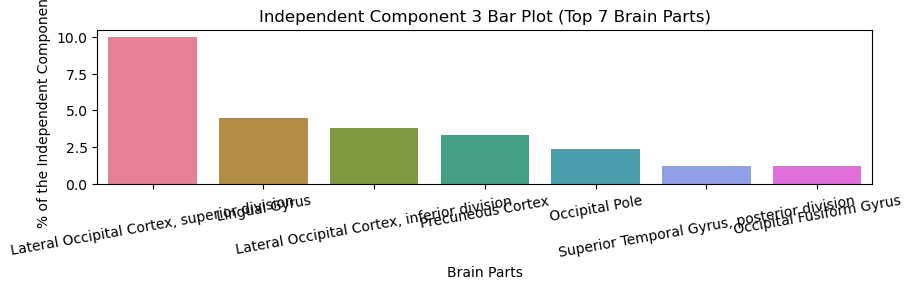

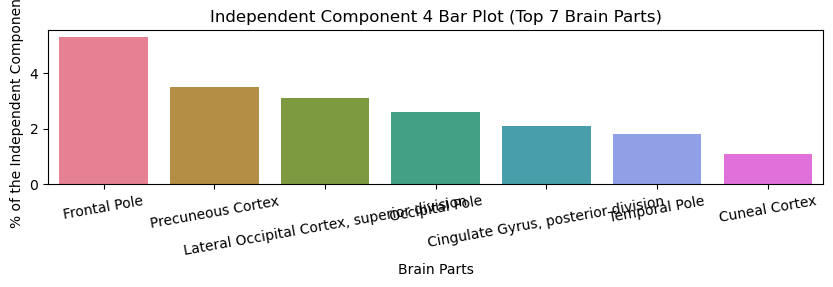

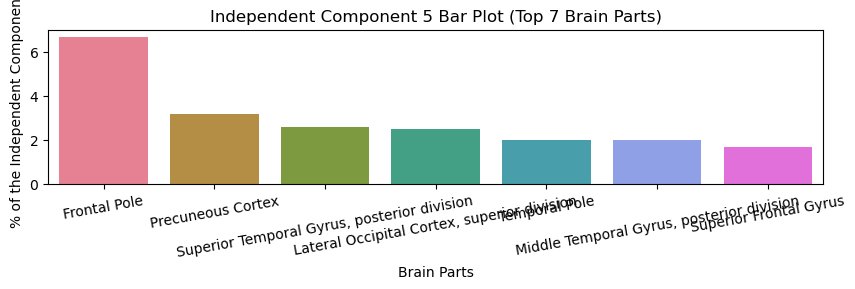

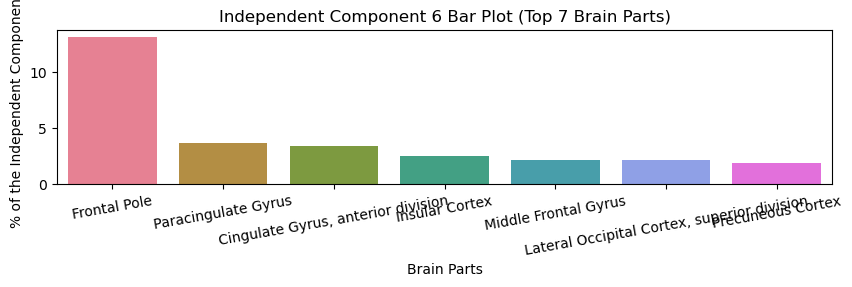

In [ ]:
# Define the number of top brain parts to display
import seaborn as sns
from matplotlib import ticker

num_components = 4
top_n = 7
df = results.copy()
# Create four Seaborn bar plots for each independent component
acronyms = pd.Series(df.columns).apply(lambda bp: initials(bp).upper()).values.tolist()
#df.columns = acronyms
display(acronyms, df.columns)
for ic in range(num_components):
    # Sort brain parts by value and select the top 5
    sorted_brain_parts = pd.Series(df.iloc[ic].sort_values(ascending=False).index[:top_n])
    #tickslabels = sorted_brain_parts.apply(lambda bp: bp.split(',')[0]).values.tolist()
    #display(tickslabels)
    plt.figure(figsize=(10, 2))
    sns.barplot(data=df.loc[[ic], sorted_brain_parts], orient='v', palette='husl')
    plt.xlabel('Brain Parts')
    plt.ylabel('% of the Independent Component[')
    plt.title(f'Independent Component {ic + 3} Bar Plot (Top 7 Brain Parts)')
    plt.xticks(rotation = 10)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
    #ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))
    #ax.xaxis.set_minor_formatter(ticker.FixedFormatter(sorted_brain_parts))
    #ax.tick_params(axis='x', which='minor', length=20)
    #ax.tick_params(axis='x', which='both', color='lightgrey')
    #ax.autoscale(enable=True, axis='x', tight=True)

    plt.savefig(f"plot_barplotIC{ic+1}.png", bbox_inches='tight', dpi = 200)
    plt.show()

[3900.0,
 375.0,
 795.0000000000001,
 705.0,
 705.0,
 2655.0,
 734.9999999999999,
 570.0,
 555.0,
 750.0,
 1785.0,
 720.0,
 750.0]

NodeView(('Lateral Occipital Cortex, superior division', 'Lingual Gyrus', 'Lateral Occipital Cortex, inferior division', 'Precuneous Cortex', 'Occipital Pole', 'Frontal Pole', 'Cingulate Gyrus, posterior division', 'Superior Temporal Gyrus, posterior division', 'Temporal Pole', 'Paracingulate Gyrus', 'Cingulate Gyrus, anterior division', 'Insular Cortex', 'Middle Frontal Gyrus'))

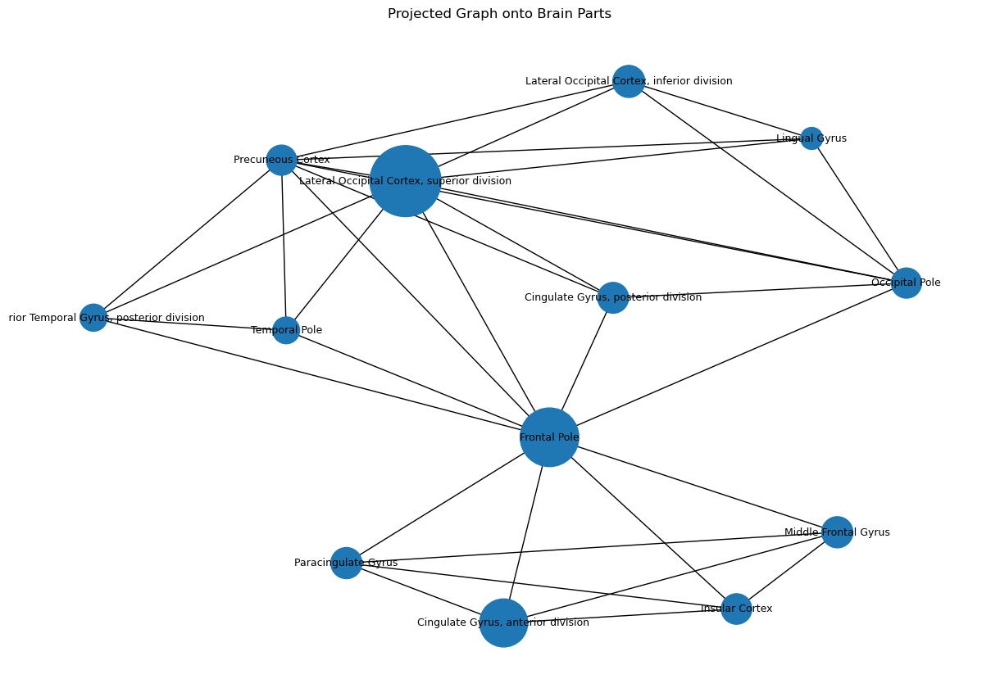

In [ ]:
df = results
top_n = 5
def create_bipartite_graph(df, top_n):
    G = nx.Graph()

    for ic in df.index:
        top_brain_parts = df.loc[ic].nlargest(top_n).index
        G.add_node(ic, bipartite=0)  # Independent component
        G.add_nodes_from(top_brain_parts, bipartite=1)  # Brain parts
        for part in top_brain_parts:
            weight = df.loc[ic][part]
            G.add_edge(ic, part, weight=weight)

    return G
    
def create_projected_graph(G, nodes, bipartite):
    projected_graph = nx.bipartite.weighted_projected_graph(G, nodes, ratio=False)
    return projected_graph

def draw_projected_graph(G, df):
    pos = nx.kamada_kawai_layout(G)
    
    # Calculate the node sizes as the sum of values in the table for each component
    node_sizes = [150*df[part].sum() for part in df.columns if part in G.nodes]
    display(node_sizes)
    display(G.nodes)
    plt.figure(figsize=(12,8))
    nx.draw(G, pos, node_size = node_sizes, with_labels=True, font_size = 9)
    plt.title("Projected Graph onto Brain Parts")
    plt.savefig("graph.png", bbox_inches='tight', dpi = 200)
    plt.show()

bipartite_graph = create_bipartite_graph(df, top_n)
projected_graph = create_projected_graph(bipartite_graph, [node for node, node_data in bipartite_graph.nodes(data=True) if node_data['bipartite'] == 1], bipartite=1)
draw_projected_graph(projected_graph, df)

# Brain extraction, for IC Overlay

In [ ]:
reset_overlays()
sub= 'sub-04'
load(op.join(bids_root, sub, 'anat', 'sub-04_T1w.nii.gz'))
name = 'sub-04_T1w.nii.gz'

In [ ]:
anatomical_path = op.join(bids_root, sub, 'anat', 'sub-04_T1w.nii.gz')   
betted_brain_path = op.join(preproc_root, sub, 'anat', 'sub-04_T1w_ext')

bet(anatomical_path, betted_brain_path, mask=True, robust=True, fracintensity = 0.4)
    

{}

In [ ]:
print_dir_tree(bids_root, max_depth=5)

|ds001145/
|--- CHANGES
|--- README
|--- dataset_description.json
|--- derivatives/
|------ preprocessed_data/
|--------- sub-04/
|------------ anat/
|--------------- sub-04_T1w_ext.nii.gz
|--------------- sub-04_T1w_ext_mask.nii.gz
|--- sub-04/
|------ anat/
|--------- sub-04_T1w.nii.gz
|------ func/
|--------- sub-04_task-watchmovie_bold.nii.gz


In [ ]:
load(betted_brain_path + "_mask.nii.gz")

Image(sub-04_T1w_ext_mask, /home/hajoub/Desktop/MyFiles/NSSP_proj2/dataset/ds001145/derivatives/preprocessed_data/sub-04/anat/sub-04_T1w_ext_mask.nii.gz)

In [ ]:
img = nib.load(op.join(bids_root, sub, 'func', 'sub-04_task-watchmovie_bold.nii.gz')   )
affine = img.affine
fdata = img.get_fdata()
x, y, z, N_vol = fdata.shape

In [ ]:
display(x, y, z, N_vol)
X_ = fdata.reshape(-1, fdata.shape[-1])
X = X_.T
display(X.shape)
mask_path = betted_brain_path + "_mask.nii.gz"
T1w_img = nib.load(anatomical_path)
mask = nob.load(mask_path)

icbms = datasets.fetch_icbm152_2009()
#masker = NiftiMasker(mask_img=icbms.mask)
mask_path = betted_brain_path + "_mask.nii.gz"
masker = NiftiMasker(mask_img= mask_path)
plot_stat_map(icbms.mask, black_bg=True, title='the brain mask', colorbar=False,)

61

73

61

1028

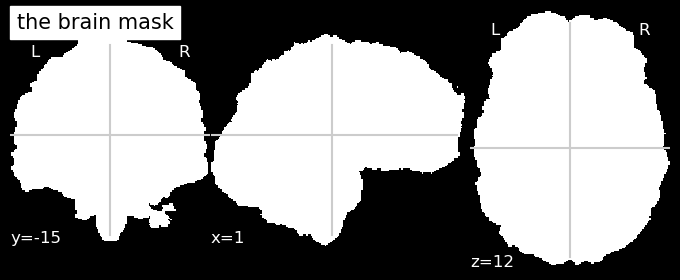

In [ ]:
mask_path = betted_brain_path + "_mask.nii.gz"
masker = NiftiMasker(mask_img= mask_path)
plot_stat_map(mask_path, black_bg=True, title='the brain mask', colorbar=False,bg_img= None)

'Got fdata of dimensions ='

61

73

61

1028

'X shape ='

(1028, 271633)

array([9.99968829e-01, 3.39776795e-06, 1.76236724e-06, 1.56847129e-06,
       1.40762376e-06, 1.06679638e-06, 9.97098999e-07, 8.92372876e-07])

'Explained Variance = '

0.9999799218621123

'Running FastICA with n = 4 components'

'size H'

(271633, 8)

'size S'

(271633, 4)

'Done ICA'

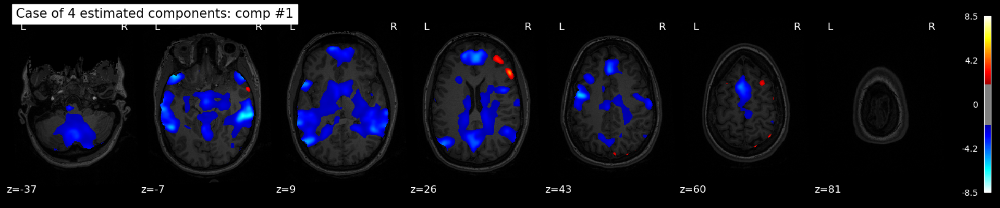

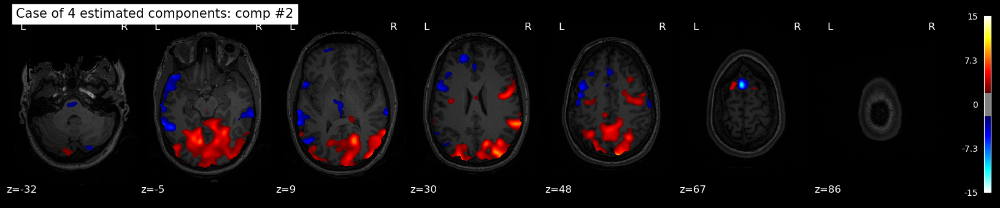

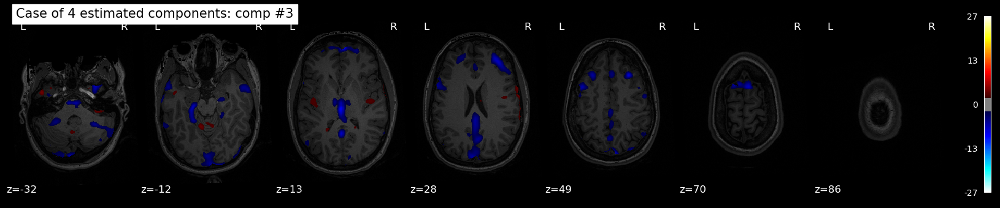

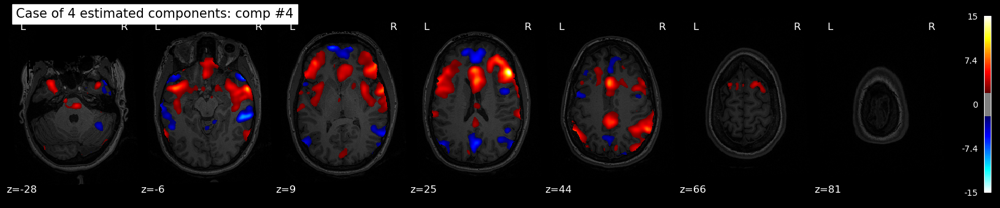

'Done all'

{4: array([[ 0.48493828, -0.1881622 ,  0.17143622, -0.20703887],
        [ 0.48493822, -0.18816195,  0.1714371 , -0.20703881],
        [ 0.48493822, -0.18816195,  0.1714371 , -0.20703881],
        ...,
        [ 0.48493822, -0.18816195,  0.1714371 , -0.20703881],
        [ 0.48493822, -0.18816195,  0.1714371 , -0.20703881],
        [ 0.48493822, -0.18816195,  0.1714371 , -0.20703881]])}

In [4]:
spatial_ICA(func_path = func_name, anat_path = anat_name, ica_comp = 4, pca = True, filename = "first_4")

## GLM Across Groups 

In [ ]:
#Downloading the 10 first subjects.
max_sub_num = 3
sub_nums  = [i for i in range(1,max_sub_num + 1)]
sub_nums

[1, 2, 3]

In [ ]:
dataset_id = 'ds001145'


# Download one subject's data from each dataset
sample_path = "dataset"
mkdir_no_exist(sample_path)
bids_root = op.join(os.path.abspath(""),sample_path, dataset_id)
deriv_root = op.join(bids_root, 'derivatives')
preproc_root = op.join(bids_root, 'derivatives','preprocessed_data')

mkdir_no_exist(bids_root)

In [ ]:
def performing_glm (events, fmri_img, rep_time, frame_times) : 

    fmri_glm = FirstLevelModel(t_r=rep_time,
                               noise_model='ar1',
                               standardize=False,
                               hrf_model='spm',
                               drift_model=None,
                               high_pass=.01)
    design_matrices = make_first_level_design_matrix(frame_times, events,
                          drift_model='polynomial', drift_order=3)

    
    # Fit the model to our design and data
    return fmri_glm.fit(subject_data, design_matrices=design_matrices), design_matrices

In [ ]:
watch =  [0]*8 + [1]*990
duration =[1.5]*998
onset = np.arange(3, 1500, 1.5)
events = {'trial_type':watch, 'duration' :duration, 'onset': onset}
events_df = pd.DataFrame(events)
rep_time = 1.5

In [ ]:
from nilearn.glm.first_level import make_first_level_design_matrix, FirstLevelModel
import numpy as np
import pandas as pd

glm_fits = []
dms =[]
for sub_num in sub_nums:
    subject = f'0{sub_num}'
    f_data_path = op.join(bids_root,subject,f'sub-0{sub_num}','func',f'sub-0{sub_num}_task-watchmovie_bold.nii.gz')
    subject_data = nib.load(f_data_path)
    subject_data = subject_data.slicer[..., :998]
    fmri_glm, dm = performing_glm(events_df, subject_data, rep_time, onset)
    glm_fits.append(fmri_glm)
    dms.append(dm)

In [ ]:
len(glm_fits)

3

Here we don't need to concatenate the data since it's already 4D data.

In [ ]:
print(glm_fits[0].design_matrices_)

[               0    1   drift_1   drift_2   drift_3  constant
3.0     0.000000  0.0 -0.498999  0.165834 -0.049551       1.0
4.5     0.004070  0.0 -0.497998  0.164836 -0.048954       1.0
6.0     0.107214  0.0 -0.496997  0.163840 -0.048361       1.0
7.5     0.430040  0.0 -0.495996  0.162846 -0.047771       1.0
9.0     0.837663  0.0 -0.494995  0.161854 -0.047183       1.0
...          ...  ...       ...       ...       ...       ...
1492.5  0.000000  1.0  0.494995  0.161854  0.047183       1.0
1494.0  0.000000  1.0  0.495996  0.162846  0.047771       1.0
1495.5  0.000000  1.0  0.496997  0.163840  0.048361       1.0
1497.0  0.000000  1.0  0.497998  0.164836  0.048954       1.0
1498.5  0.000000  1.0  0.498999  0.165834  0.049551       1.0

[998 rows x 6 columns]]


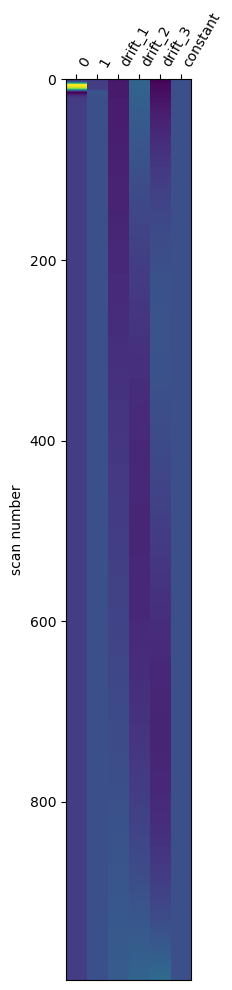

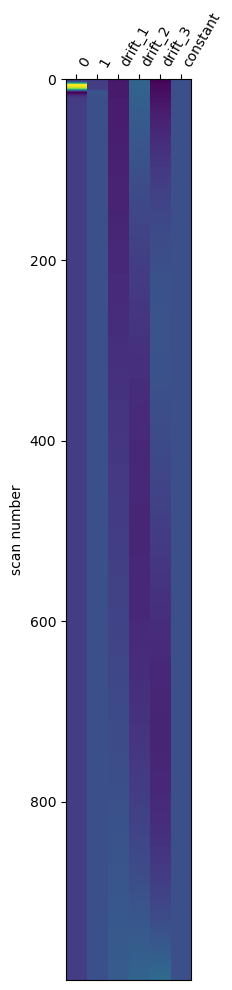

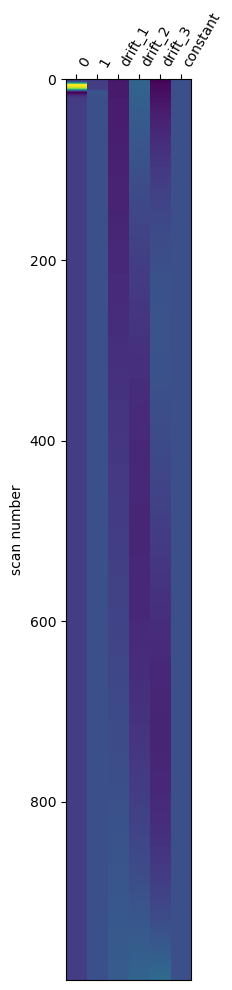

In [ ]:
from nilearn.plotting import plot_design_matrix
for dm in dms :    
    plot_design_matrix(dm)
plt.show()

In [ ]:
from nilearn import plotting

# Define the contrast vector for the difference between watching and not watching
contrast_vector = [[1,-1,0,0,0,0]]
z_maps=[]
# Compute the contrast
for i in range (3):
    z_maps.append(glm_fits[i].compute_contrast(contrast_vector, stat_type='F', output_type='z_score'))

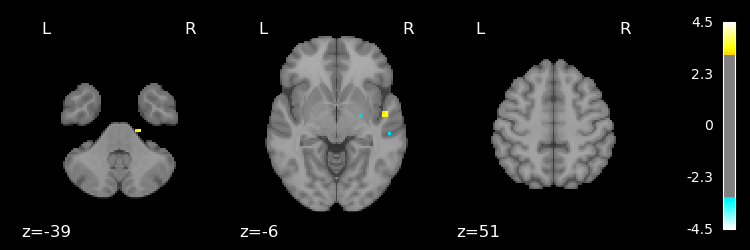

In [ ]:
plotting.plot_stat_map(z_maps[0], threshold=3.1, display_mode='z', cut_coords=3, black_bg=True)
# Show the plot
plotting.show()

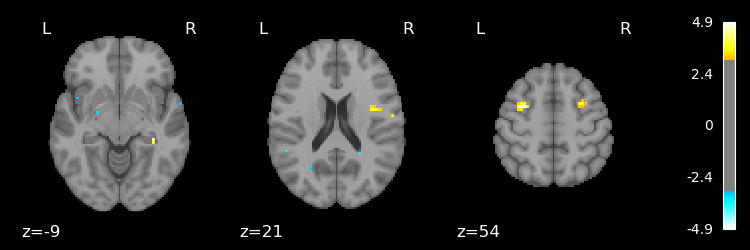

In [ ]:
plotting.plot_stat_map(z_maps[1], threshold=3.1, display_mode='z', cut_coords=3, black_bg=True)
# Show the plot
plotting.show()

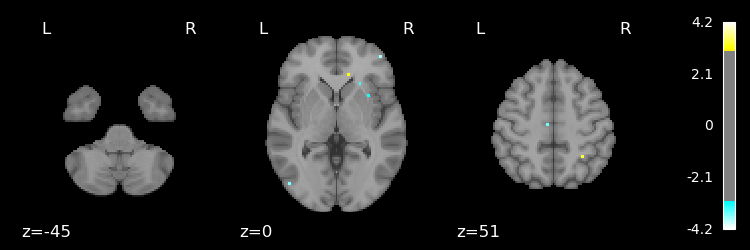

In [ ]:
plotting.plot_stat_map(z_maps[2], threshold=3.1, display_mode='z', cut_coords=3, black_bg=True)
# Show the plot
plotting.show()

#### Now let's assess the consistency of our results across subjects

In [ ]:
from nilearn.glm.second_level import SecondLevelModel
from nilearn.plotting import plot_stat_map

# Let's assume contrast_maps is a list of file paths to the contrast maps of each subject
z_maps = ['sub01_contrast.nii.gz', 'sub02_contrast.nii.gz', ...]

# Instantiate the second-level model
second_level_model = SecondLevelModel(smoothing_fwhm=8.0)

# Fit the model to the contrast maps
second_level_model = second_level_model.fit(contrast_maps)

# Define the one-sample t-test contrast: [1] means we test the mean against 0
second_level_contrast = [1]

# Compute the contrast of the one-sample t-test
z_map = second_level_model.compute_contrast(second_level_contrast,
                                            output_type='z_score')

# Plot the second-level contrast map
plot_stat_map(z_map, threshold=3.1, display_mode='z', cut_coords=3, black_bg=True)

# Save the second-level contrast map
z_map.to_filename('group_level_z_map.nii.gz')


# Functional Connectivity

In [ ]:
roi_time_series_list = []
for sub_id in range(1,25):
    if sub_id < 10: sub_id = f'0{sub_id}'
    # Load the fMRI data
    fmri_data_nii = nib.load(rf'E:\Datasets\movie_data\ds001145-download\sub-{sub_id}\func\sub-{sub_id}_task-watchmovie_bold.nii.gz')
    fmri_data = fmri_data_nii.get_fdata()

    # Load atlas for ROI definitions
    atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr50-2mm')

    # Resample atlas to match fMRI data
    atlas_resampled = image.resample_to_img(atlas.maps, fmri_data_nii, interpolation='nearest')

    # Select ROIs - this could be based on your specific needs
    selected_roi_labels = atlas['labels']  # up to 49 names

    # Extract the average time series for the selected ROIs
    roi_time_series = []
    for label in selected_roi_labels:
        roi_mask = image.math_img(f"np.where(img == {atlas.labels.index(label)}, 1, 0)", img=atlas_resampled)
        masked_data = fmri_data[roi_mask.get_fdata().astype(bool)]
        roi_time_series.append(masked_data.mean(axis=0))

    roi_time_series = np.array(roi_time_series)
    roi_time_series_list.append(roi_time_series)
roi_time_series = np.array(roi_time_series_list)


In [ ]:
roi_time_series = np.array(roi_time_series_list)
print(roi_time_series.shape)
atlas['labels'][26] = 'Juxtapositional Lobule Cortex'

(24, 49, 1028)


In [ ]:
corr_list_all = []
for sub_id in range(24):
    seed_func = roi_time_series[sub_id,10]
    corr_list = []
    for i in range(roi_time_series.shape[1]):
        if i==10 or i==0: continue
        corr = np.corrcoef(seed_func, roi_time_series[sub_id,i])[0,1]
        corr_list.append(corr)
    corr_list_all.append(np.array(corr_list))

In [ ]:
corr_box_plot = np.array(corr_list_all)
corr_box_plot.shape

(24, 47)

## Correlation between other regions and the seed (p-STG)

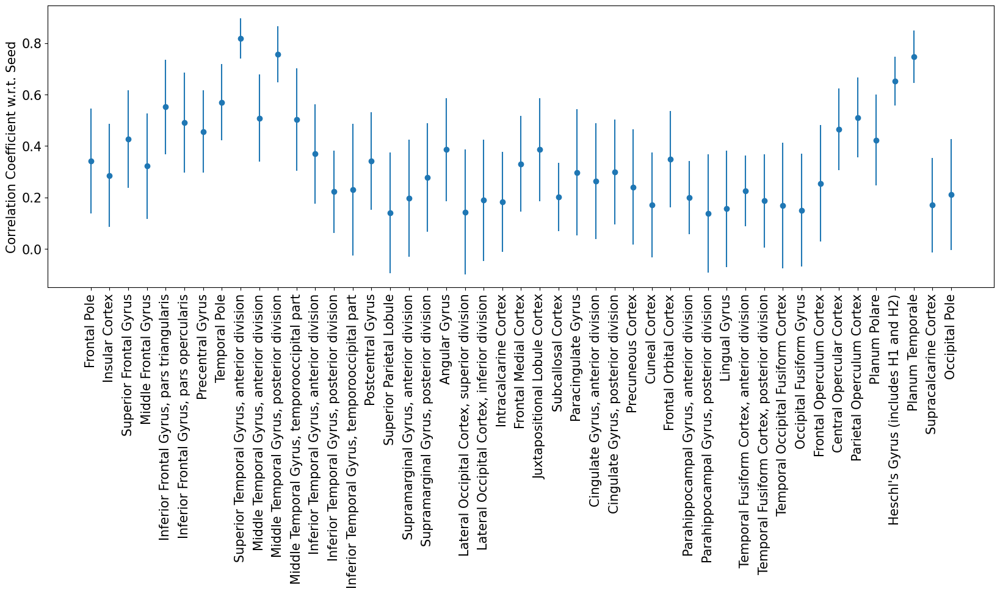

In [ ]:
atlas['labels'][26] = 'Juxtapositional Lobule Cortex'
plt.figure(figsize=(20,6))
plt.errorbar(np.arange(corr_box_plot.shape[1]), corr_box_plot.mean(axis=0), yerr=corr_box_plot.std(axis=0), fmt="o")
plt.ylabel('Correlation Coefficient w.r.t. Seed',fontsize=15)
# plt.xlabel('Brain Region of Interest')
plt.yticks(fontsize=15)
plt.xticks(np.arange(47), atlas['labels'][1:10]+atlas['labels'][11:],fontsize=15, rotation=90)

plt.show()

In [ ]:
roi_names=atlas['labels'][1:10]+atlas['labels'][11:]

top9_indices = np.argsort(corr_box_plot.mean(axis=0))[-9:].astype(int)
top9_roi_names = []
for i in range(len(top9_indices)):
    top9_roi_names.append(roi_names[top9_indices[i]])
print(top9_roi_names)

['Middle Temporal Gyrus, temporooccipital part', 'Middle Temporal Gyrus, anterior division', 'Parietal Operculum Cortex', 'Inferior Frontal Gyrus, pars triangularis', 'Temporal Pole', "Heschl's Gyrus (includes H1 and H2)", 'Planum Temporale', 'Middle Temporal Gyrus, posterior division', 'Superior Temporal Gyrus, anterior division']


## Full Correlation Matrix for all 48 regions (Background Excluded)

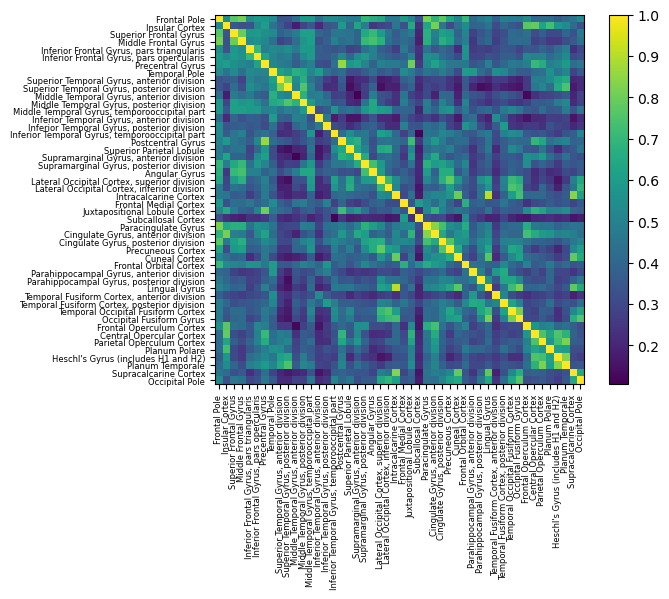

In [ ]:
avg_corr_matr = np.zeros((49,49))
for i in range(24):
    corr_matr = np.corrcoef(roi_time_series[i])
    avg_corr_matr += corr_matr
avg_corr_matr /= 24
plt.imshow(avg_corr_matr[1:,1:])
plt.xticks(np.arange(48),atlas['labels'][1:],fontsize=6,rotation=90)
plt.yticks(np.arange(48),atlas['labels'][1:],fontsize=6)
plt.colorbar()
plt.show()

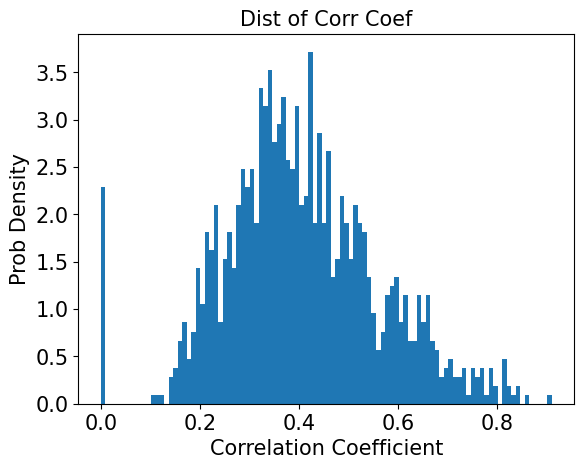

In [ ]:
func_corr_matr = avg_corr_matr[1:,1:] - np.eye(48)
plt.hist(func_corr_matr.reshape(-1), bins=100,density=True)
plt.ylabel('Prob Density',fontsize=15)
plt.xlabel('Correlation Coefficient',fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Dist of Corr Coef',fontsize=15)
plt.show()

In [ ]:
def ComputeAdjacency(X):    
    return np.corrcoef(X)-np.diag(np.diag(np.corrcoef(X)))

def BinarizeAdjacency(A,rho):
    #Do not change the following three lines for extracting off-diagonal entries
    N = A.shape[0] #find the size of the matrix

    # Find the indices of the upper triangle
    ind = np.triu_indices(N, k=1)

    # Vectorize the element (strictly) above the main diagonal of the adjacency
    vec = A[ind] 

    # Declare output vector vec2
    vec2 = vec.copy()
    # Sort and flip (sorted returns from small to big)
    indmax = np.flip(np.argsort(vec))
    # Get the index of the maximum argument that we want to keep
    perc_keep = int(np.round(rho*len(vec)))
    # Declare output vector
    vec2 = np.zeros(vec.shape)
    # Use indexing with indmax to indicete the indices to set to 1 and 0. 
    vec2[indmax[0:perc_keep,]] = 1
    vec2[indmax[(perc_keep+1):],] = 0

    # Binarize the vector vec, and keep the result in the variable vec2
    # Declare A2
    A2 = np.zeros((N,N))
    # Set upper triangle to the data of vec2
    A2[ind] = vec2
    # Add it to its transpose, to fill the lower triangle while
    A2=A2+A2.T
    # Make sure that the diagonal is filled with 0s
    A2 = A2 - np.diag(np.diag(A2))
    
    return A2

bin_func_con = BinarizeAdjacency(func_corr_matr, .3)

def ComputeC(adj1):
    
    ccoefs = nx.algorithms.cluster.clustering(nx.from_numpy_array(adj1.astype(int)))
    
    return np.asarray(list(ccoefs.values()))

C_list = ComputeC(bin_func_con)

## Binarize the Correlation Matrix into Adjacency Matrix

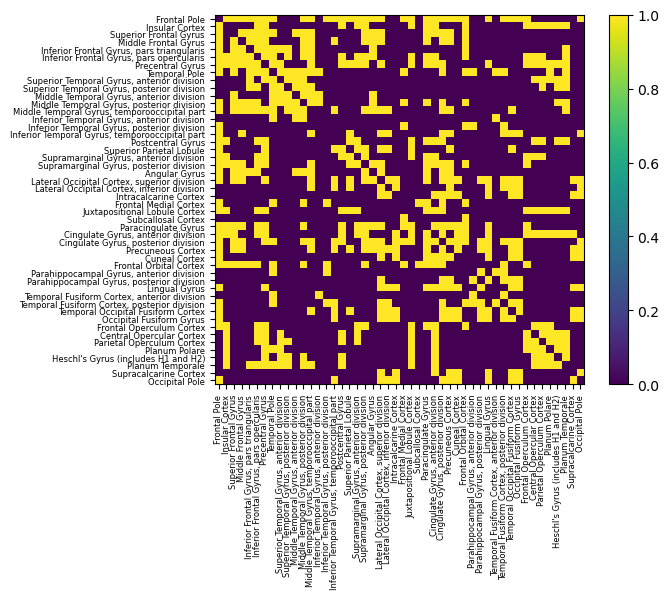

In [ ]:
plt.imshow(bin_func_con)
plt.xticks(np.arange(48),atlas['labels'][1:],fontsize=6,rotation=90)
plt.yticks(np.arange(48),atlas['labels'][1:],fontsize=6)
plt.colorbar()
plt.show()

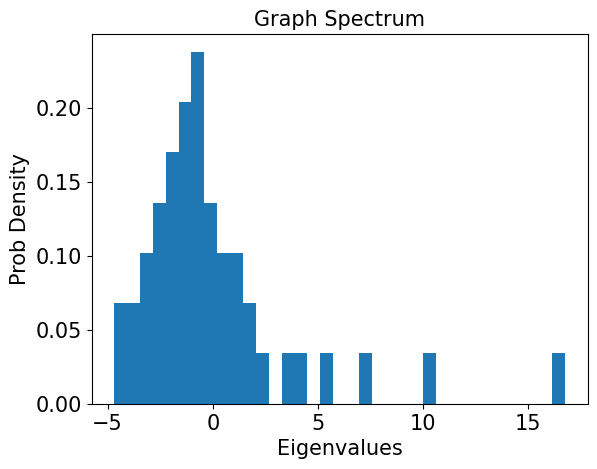

In [ ]:
plt.hist(np.linalg.eigvals(bin_func_con), bins=35,density=True)
plt.ylabel('Prob Density',fontsize=15)
plt.xlabel('Eigenvalues',fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Graph Spectrum',fontsize=15)
plt.show()

## Distribution of degree for the 48-node full graph

(48, 48)


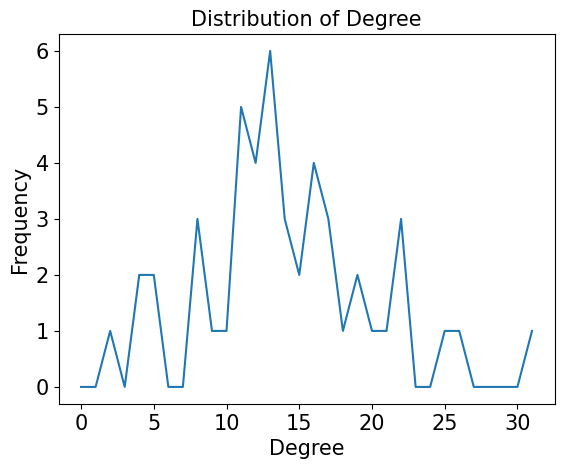

In [ ]:
def degree_distribution(adjacency_matrix):
    """
    Calculate the degree distribution of a graph from its adjacency matrix.

    :param adjacency_matrix: A square numpy array representing the adjacency matrix of a graph
    :return: A list where the i-th element is the number of nodes with degree i
    """
    # Ensure the adjacency matrix is square
    assert adjacency_matrix.shape[0] == adjacency_matrix.shape[1], "Adjacency matrix must be square."

    # Summing along axis 1 computes the degree of each node (row)
    degrees = adjacency_matrix.sum(axis=1)
    
    # The maximum degree is the length of our distribution list
    max_degree = degrees.max()

    # Initialize a list to hold the degree distribution
    degree_distribution = [0] * (max_degree + 1)
    
    # Count the frequencies of each degree in the graph
    for degree in degrees:
        degree_distribution[degree] += 1

    return degree_distribution
print(bin_func_con.shape)
plt.plot(np.arange(len(degree_distribution(bin_func_con.astype(int)))), degree_distribution(bin_func_con.astype(int)))
plt.ylabel('Frequency',fontsize=15)
plt.xlabel('Degree',fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Distribution of Degree',fontsize=15)
plt.show()

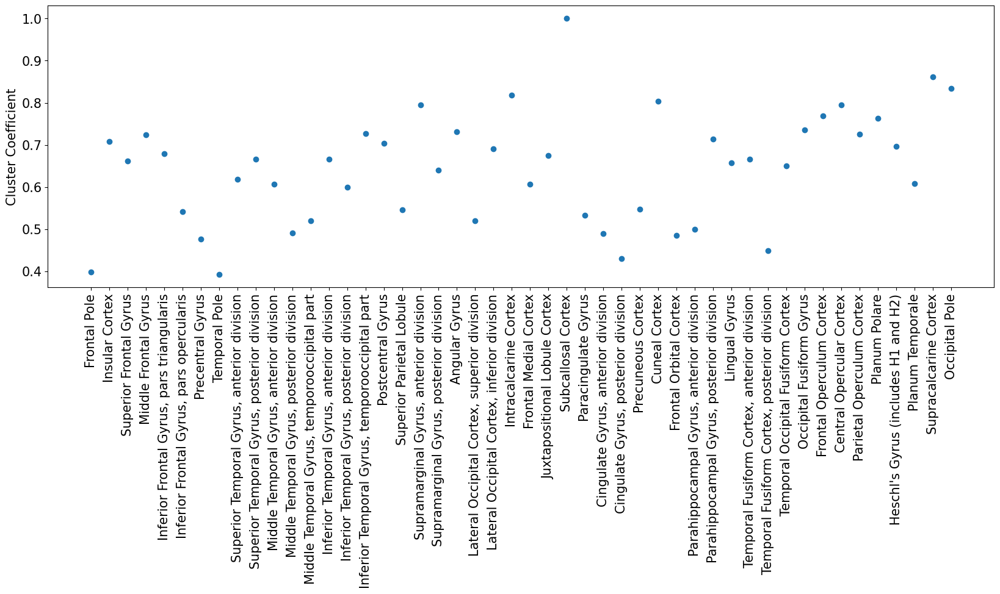

In [ ]:
plt.figure(figsize=(20,6))
plt.errorbar(np.arange(48), C_list, yerr=0, fmt="o")
plt.ylabel('Cluster Coefficient',fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(np.arange(48), atlas['labels'][1:],fontsize=15, rotation=90)

plt.show()

In [ ]:
top10_roi_names = top9_roi_names + ['Superior Temporal Gyrus, posterior division']
top10_roi_names
top10_roi_names_short = [
    'MTG-t',
    'MTG-a',
    'POC',
    'IFG-pt',
    'Temporal Pole',
    "Heschl's Gyrus",
    'Planum Temporale',
    'MTG-p',
    'STG-a',
    'STG-p'
]

In [ ]:
name_map = {k:v for (k,v) in zip(indices, top10_roi_names_short)}
atlas['labels'][1:]

['Frontal Pole',
 'Insular Cortex',
 'Superior Frontal Gyrus',
 'Middle Frontal Gyrus',
 'Inferior Frontal Gyrus, pars triangularis',
 'Inferior Frontal Gyrus, pars opercularis',
 'Precentral Gyrus',
 'Temporal Pole',
 'Superior Temporal Gyrus, anterior division',
 'Superior Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, anterior division',
 'Middle Temporal Gyrus, posterior division',
 'Middle Temporal Gyrus, temporooccipital part',
 'Inferior Temporal Gyrus, anterior division',
 'Inferior Temporal Gyrus, posterior division',
 'Inferior Temporal Gyrus, temporooccipital part',
 'Postcentral Gyrus',
 'Superior Parietal Lobule',
 'Supramarginal Gyrus, anterior division',
 'Supramarginal Gyrus, posterior division',
 'Angular Gyrus',
 'Lateral Occipital Cortex, superior division',
 'Lateral Occipital Cortex, inferior division',
 'Intracalcarine Cortex',
 'Frontal Medial Cortex',
 'Juxtapositional Lobule Cortex',
 'Subcallosal Cortex',
 'Paracingulate Gyrus',
 'Cingulate Gyru

## Visualize the 10-node sub-graph

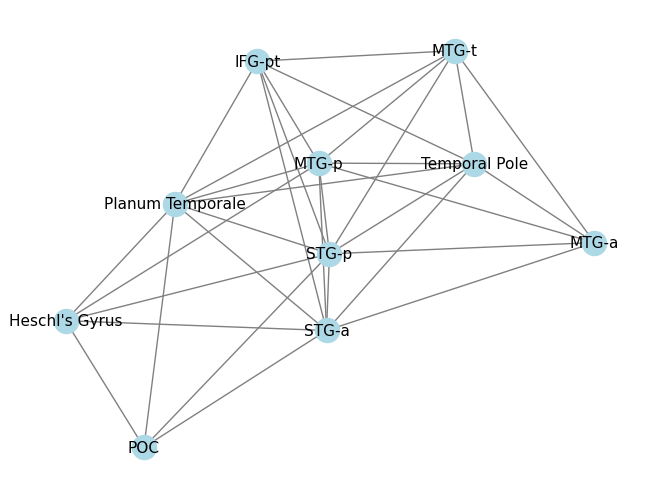

In [ ]:
def visualize_subgraph(adjacency_matrix, subgraph_nodes,new_labels=None):
    """
    Visualize a subgraph specified by the subgraph_nodes from a graph described by the adjacency_matrix.

    :param adjacency_matrix: A numpy array representing the adjacency matrix of the full graph.
    :param subgraph_nodes: A list of nodes to include in the subgraph.
    """
    # Create a graph from the adjacency matrix
    G = nx.from_numpy_array(adjacency_matrix)
    
    # Generate subgraph
    H = G.subgraph(subgraph_nodes)
    if new_labels:
        H = nx.relabel_nodes(H, new_labels)
    # Draw the subgraph
    # plt.figure(figsize=(10,10))
    pos = nx.spring_layout(H)  # positions for all nodes
    nx.draw(H, pos, with_labels=True, node_color='lightblue', edge_color='gray', font_size=11)
    
    plt.show()

def find_subgraph(adj_matrix, nodes):
    """
    Visualize a subgraph specified by 'nodes' and return its adjacency matrix.

    :param adj_matrix: The adjacency matrix of the full graph.
    :param nodes: List of nodes to include in the subgraph.
    :return: Adjacency matrix of the subgraph.
    """
    # Create a graph from the adjacency matrix
    G = nx.from_numpy_array(adj_matrix)
    
    # Generate the subgraph
    subgraph = G.subgraph(nodes)
    
    # Get the adjacency matrix of the subgraph as a numpy array
    sub_adj_matrix = nx.to_numpy_array(subgraph)
    
    return sub_adj_matrix

visualize_subgraph(bin_func_con, [12, 10, 42, 4, 7, 44, 45, 11, 8, 9],new_labels=name_map)
sub_adj = find_subgraph(bin_func_con, [12, 10, 42, 4, 7, 44, 45, 11, 8, 9])

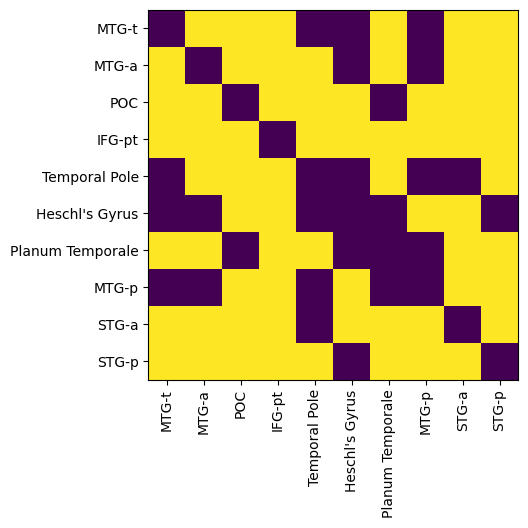

In [ ]:
plt.imshow(sub_adj)
plt.xticks(np.arange(10),top10_roi_names_short,fontsize=10,rotation=90)
plt.yticks(np.arange(10),top10_roi_names_short,fontsize=10)
plt.show()

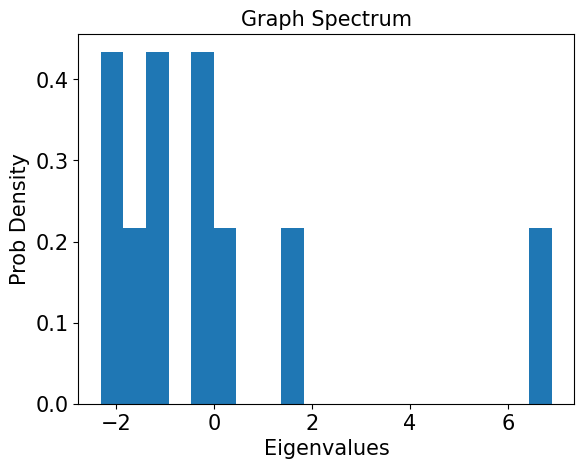

In [ ]:
plt.hist(np.linalg.eigvals(sub_adj), bins=20,density=True)
plt.ylabel('Prob Density',fontsize=15)
plt.xlabel('Eigenvalues',fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Graph Spectrum',fontsize=15)
plt.show()

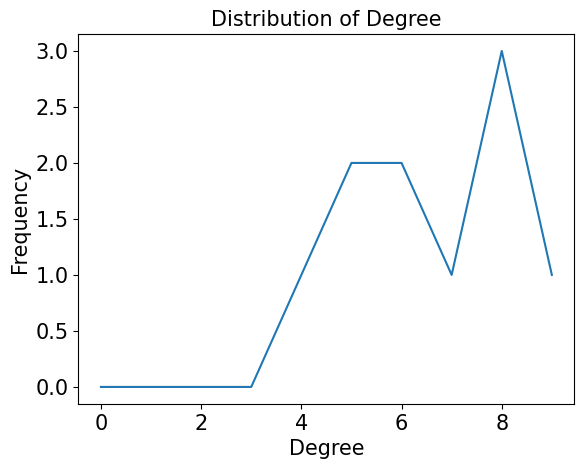

In [ ]:
plt.plot(np.arange(len(degree_distribution(sub_adj.astype(int)))), degree_distribution(sub_adj.astype(int)))
plt.ylabel('Frequency',fontsize=15)
plt.xlabel('Degree',fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Distribution of Degree',fontsize=15)
plt.show()

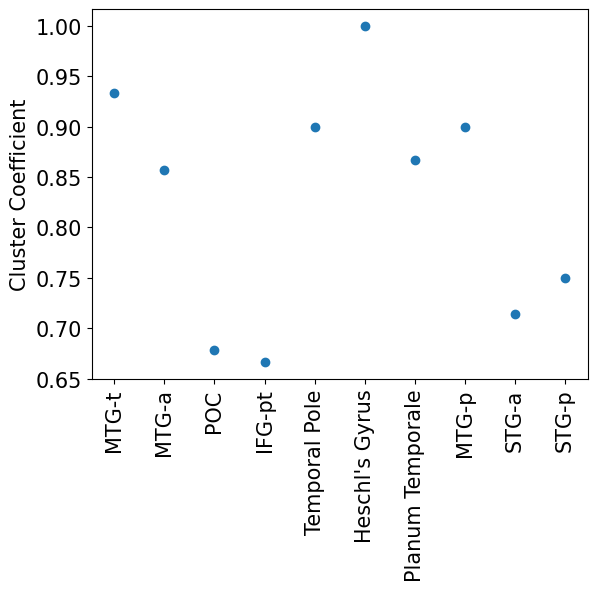

In [ ]:
C_list = ComputeC(sub_adj)
# plt.figure(figsize=(20,6))
plt.errorbar(np.arange(10), C_list, yerr=0, fmt="o")
plt.ylabel('Cluster Coefficient',fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(np.arange(10), top10_roi_names_short, fontsize=15, rotation=90)

plt.show()

In [ ]:
avg_corr_matr
# Create a graph from the adjacency matrix
G = nx.from_numpy_array(avg_corr_matr)

# Generate subgraph
H = G.subgraph([12, 10, 42, 4, 7, 44, 45, 11, 8, 9])

(10, 10)


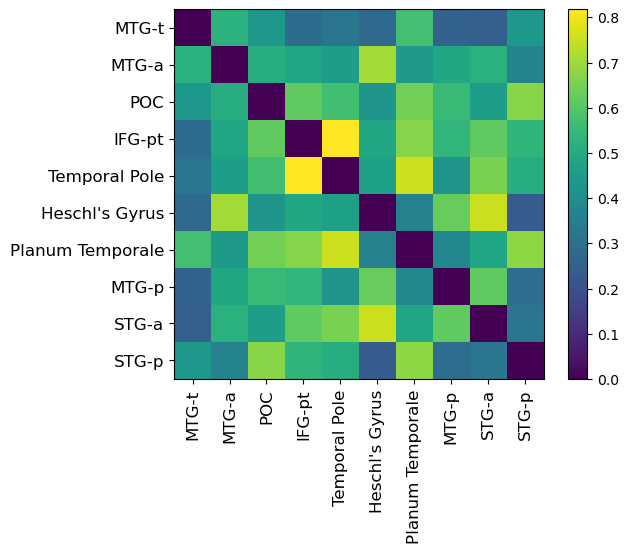

In [ ]:
sub_adj_matrix = nx.to_numpy_array(H)
print(sub_adj_matrix.shape)
plt.imshow(sub_adj_matrix-np.eye(10))
plt.xticks(np.arange(10),top10_roi_names_short,fontsize=12,rotation=90)
plt.yticks(np.arange(10),top10_roi_names_short,fontsize=12)
plt.colorbar()
plt.show()